In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pystan 
import pandas as pd
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import pickle
from tqdm.notebook import tqdm as tqdm
import math
from scipy.stats import gaussian_kde

In [2]:
sm_solo = pickle.load(open('Single strain for Strain MPC stan.pkl', 'rb'))
sm_MVN = pickle.load(open('Single strain MVN for Strain MPC stan.pkl', 'rb'))

In [3]:
data = pd.read_csv('Cam_all_55ºC_2023_02_09.csv')
data = data[(data["Strain_Name"]!="RIMD 0366027")&(data["Strain_Name"]!="RIMD 0366043")]
data["ID_strain_II"] = (data["ID_strain"] != data["ID_strain"].shift(1)).cumsum()
data["ID_strain_origin"] = data["ID_strain"]
data["ID_strain"] = data["ID_strain_II"]
data = data.drop("ID_strain_II", axis=1)
pd.set_option('display.max_rows', None)
data

,Strain_Name,ID_strain,rep_ID,t_heat,n_dilu,V,non_detect,Nt_count,LogSt,ID_strain_origin
0,ATCC 33250,1,1,0.00,3,0.000540,0,381,-0.017318,1
1,ATCC 33250,1,1,0.00,3,0.000540,0,412,0.016654,1
2,ATCC 33250,1,2,0.00,3,0.000540,0,370,-0.028945,1
3,ATCC 33250,1,2,0.00,3,0.000540,0,421,0.027136,1
4,ATCC 33250,1,3,0.00,3,0.000540,0,371,0.027795,1
5,ATCC 33250,1,3,0.00,3,0.000540,0,325,-0.029696,1
6,ATCC 33250,1,1,2.25,2,0.000540,0,855,-0.666277,1
7,ATCC 33250,1,1,2.25,2,0.000540,0,853,-0.667294,1
8,ATCC 33250,1,2,2.25,2,0.000540,0,917,-0.634777,1
9,ATCC 33250,1,2,2.25,2,0.000540,0,936,-0.625871,1


In [4]:
StrainCount = 29
datum = data[data["ID_strain"]<=StrainCount]
datum
StrainName = list(datum["Strain_Name"].unique())

In [5]:
fit_solo = sm_solo.sampling(
    data = dict(N = len(datum['Nt_count']),
              L = int(StrainCount),
              K = 3,
              ID_strain = datum['ID_strain'],
              ID_rep = datum['rep_ID'],
              t_heat = datum['t_heat'],
              n_dilu = datum['n_dilu'],
              V = datum['V'],
              Nt_plate_count = datum['Nt_count']), 
    iter = 75000, chains = 4, thin = 1, warmup = 50000, seed = 1234, 
    control = dict(adapt_delta = 0.8, max_treedepth = 15))
print(fit_solo)

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000308 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000288 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.88 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sa

Inference for Stan model: anon_model_5386d57d7275f848be685f6cbb469720.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60346    1.0
LogC0[2,1]           8.35  8.0e-5   0.03    8.3   8.34   8.35   8.37    8.4  97982    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76333    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.88  47548    1.0
LogC0[5,1]           8.66  7.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 110788    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 102925    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.97   9.01   9.03   9.05   9.09  70545    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  83869    

In [6]:
samples_solo = fit_solo.extract(permuted=True)
wholedelta = samples_solo['delta'][:,0]
wholepower = samples_solo['power'][:,0]
for i in range(StrainCount):
    wholedelta = np.concatenate([wholedelta, samples_solo['delta'][:,i]])
    wholepower = np.concatenate([wholepower, samples_solo['power'][:,i]])

In [7]:
dens_wholedelta, X_delta = np.histogram(wholedelta, range = (0,4), bins = 400, density = True)
dx_delta = X_delta[1]-X_delta[0]
cumu_wholedelta = np.append(0, np.cumsum(dens_wholedelta)*dx_delta)

dens_wholepower, X_power = np.histogram(wholepower, range = (0,2), bins = 200, density = True)
dx_power = X_power[1]-X_power[0]
cumu_wholepower = np.append(0, np.cumsum(dens_wholepower)*dx_power)

In [8]:
Ranges = range(3, 28)
N_test = range(10)
RMSE_delta = np.zeros([len(Ranges), len(N_test)])
RMSE_power = np.zeros([len(Ranges), len(N_test)])
for StrainCount_fit in tqdm(Ranges,desc='Progress', leave=False):
    for n_test in N_test:
        StrainCount_vali = StrainCount - StrainCount_fit
        
        StrainNum_vali = np.sort(np.random.choice(range(1,StrainCount+1), size=StrainCount_vali, replace=False))
        
        StrainNum_fit = np.array(list(range(1,StrainCount+1)))
        for i in range(len(StrainNum_vali)):
            StrainNum_fit = StrainNum_fit[StrainNum_fit!=StrainNum_vali[i]]
        
        print('StrainNum_fit: '+str(StrainNum_fit))
        
        for i in range(StrainCount_vali):
            if i == 0:
                datum_fit = data[data["ID_strain"]!=StrainNum_vali[i]]
                datum_vali =  data[data["ID_strain"]==StrainNum_vali[i]]
            if i != 0:
                datum_fit = datum_fit[datum_fit["ID_strain"]!=StrainNum_vali[i]]
                datum_vali = pd.concat([datum_vali, data[data["ID_strain"]==StrainNum_vali[i]]], axis=0, ignore_index=True)
        
        datum_fit["ID_strain_fit"] = (datum_fit["ID_strain"] != datum_fit["ID_strain"].shift(1)).cumsum()
        datum_vali["ID_strain_vali"] = (datum_vali["ID_strain"] != datum_vali["ID_strain"].shift(1)).cumsum()
        
        fit_MVN = sm_MVN.sampling(
            data = dict(N = len(datum_fit['Nt_count']),
                        L = int(StrainCount_fit),
                        K = 3,
                        ID_strain = datum_fit['ID_strain_fit'],
                        ID_rep = datum_fit['rep_ID'],
                        t_heat = datum_fit['t_heat'],
                        n_dilu = datum_fit['n_dilu'],
                        V = datum_fit['V'],
                        Nt_plate_count = datum_fit['Nt_count']), 
            iter = 75000, chains = 4, thin = 1, warmup = 50000, seed = 1234, 
            control = dict(adapt_delta = 0.8, max_treedepth = 15))
        samples_MVN = fit_MVN.extract(permuted=True)
        logParas_sim = np.empty([len(samples_MVN['delta'][:,0]), 2])
        for k in range(len(samples_MVN['delta'][:,0])):
            logParas_sim[k,:] = np.random.multivariate_normal(samples_MVN["Paras0"][k,:], samples_MVN["cov"][k,:])
        Paras_sim = np.exp(logParas_sim)
        
        dens_preddelta, X_delta2 = np.histogram(Paras_sim[:,0], range = (0,40), bins = 4000, density = True)
        dx_delta = X_delta2[1]-X_delta2[0]
        cumu_preddelta = np.append(0, np.cumsum(dens_preddelta)*dx_delta)
        cumu_preddelta = cumu_preddelta[:len(cumu_wholedelta)]
        
        dens_predpower, X_power2 = np.histogram(Paras_sim[:,1], range = (0,20), bins = 2000, density = True)
        dx_power = X_power2[1]-X_power2[0]
        cumu_predpower = np.append(0, np.cumsum(dens_predpower)*dx_power)
        cumu_predpower = cumu_predpower[:len(cumu_wholepower)]
        print(fit_MVN)
        RMSE_delta[StrainCount_fit-Ranges[0], n_test] = np.mean(((cumu_wholedelta-cumu_preddelta)**2)**0.5)
        RMSE_power[StrainCount_fit-Ranges[0], n_test] = np.mean(((cumu_wholepower-cumu_predpower)**2)**0.5)

Progress:   0%|          | 0/25 [00:00<?, ?it/s]

StrainNum_fit: [ 9 17 23]

Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 73.5456 seconds (Warm-up)
               44.632 seconds (Sampling)
               118.178 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 74.4784 seconds (Warm-up)
               45.0265 seconds (Sampling)
               119.505 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 74.4967 seconds (Warm-up)
               45.2395 seconds (Sampling)
               119.736 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 74.4088 seconds (Warm-up)
               47.6112 seconds (Sampling)
               122.02 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.34  1.6e-4   0.04   8.27   8.31   8.34   8.36   8.41  48473    1.0
LogC0[2,1]           9.03  1.1e-4   0.02   8.99   9.01   9.03   9.04   9.07  37366    1.0
LogC0[3,1]           8.32  1.0e-4   0.03   8.26    8.3   8.32   8.34   8.37  83607    1.0
LogC0[1,2]           9.33  1.0e-4   0.02   9.28   9.31   9.33   9.35   9.38  54799    1.0
LogC0[2,2]           9.12  1.1e-4   0.02   9.08   9.11   9.13   9.14   9.17  35537    1.0
LogC0[3,2]           8.87  6.0e-5   0.02   8.83   8.85   8.87   8.88    8.9  95934    1.0
LogC0[1,3]           8.73  1.4e-4   0.03   8.66   8.71   8.73   8.75   8.79  53013    1.0
LogC0[2,3]           9.18  1.1e-4   0.02   9.14   9.17   9.18    9.2   9.22  37549    



Gradient evaluation took 9e-05 seconds
Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!





Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  4.0e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  46179    1.0
LogC0[2,1]           8.35  9.7e-5   0.03    8.3   8.34   8.35   8.37    8.4  67301    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  37899    1.0
LogC0[1,2]           8.98  4.0e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  45598    1.0
LogC0[2,2]           8.91  7.7e-5   0.02   8.87    8.9   8.91   8.92   8.94  55577    1.0
LogC0[3,2]           8.79  1.7e-4   0.03   8.72   8.76   8.79   8.81   8.85  37998    1.0
LogC0[1,3]           8.91  4.0e-5 8.6e-3    8.9   8.91   8.91   8.92   8.93  45995    1.0
LogC0[2,3]           8.06  1.1e-4   0.03    8.0   8.04   8.06   8.08   8.12  69134    


Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 54.1627 seconds (Warm-up)
               28.9046 seconds (Sampling)
               83.0673 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 53.669 seconds (Warm-up)
               31.923 seconds (Sampling)
               85.592 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 53.4806 seconds (Warm-up)
               34.5642 seconds (Sampling)
               88.0447 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 53.665 seconds (Warm-up)
               37.2275 seconds (Sampling)
               90.8925 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.62  9.0e-5   0.02   8.58   8.61   8.62   8.64   8.66  51618    1.0
LogC0[2,1]           8.63  8.9e-5   0.02   8.59   8.61   8.63   8.64   8.66  44648    1.0
LogC0[3,1]           8.24  1.5e-4   0.04   8.16   8.21   8.24   8.26   8.31  61706    1.0
LogC0[1,2]           8.69  9.0e-5   0.02   8.65   8.67   8.69    8.7   8.73  47124    1.0
LogC0[2,2]           8.81  8.3e-5   0.02   8.77    8.8   8.81   8.82   8.84  42935    1.0
LogC0[3,2]           8.35  1.3e-4   0.03   8.28   8.33   8.35   8.37   8.41  60229    1.0
LogC0[1,3]           8.75  8.5e-5   0.02   8.71   8.74   8.75   8.76   8.78  48431    1.0
LogC0[2,3]           8.54  9.4e-5   0.02    8.5   8.53   8.54   8.55   8.58  44805    


Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 8.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.82 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 64.8212 seconds (Warm-up)
               37.3514 seconds (Sampling)
               102.173 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 62.8873 seconds (Warm-up)
               39.9759 seconds (Sampling)
               102.863 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 62.8973 seconds (Warm-up)
               40.4921 seconds (Sampling)
               103.389 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 63.9853 seconds (Warm-up)
               46.7269 seconds (Sampling)
               110.712 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.65  1.9e-4   0.03   8.58   8.62   8.65   8.67   8.71  29719    1.0
LogC0[2,1]           8.32  1.2e-4   0.03   8.26    8.3   8.32   8.34   8.37  58006    1.0
LogC0[3,1]           8.53  1.1e-4   0.03   8.47   8.51   8.53   8.55   8.58  75641    1.0
LogC0[1,2]           9.04  1.8e-4   0.03   8.98   9.02   9.04   9.06    9.1  30750    1.0
LogC0[2,2]           8.87  6.9e-5   0.02   8.83   8.85   8.87   8.88    8.9  71296    1.0
LogC0[3,2]           8.81  7.7e-5   0.02   8.77    8.8   8.81   8.83   8.86  81326    1.0
LogC0[1,3]           8.36  2.1e-4   0.04   8.28   8.33   8.36   8.38   8.43  31785    1.0
LogC0[2,3]           9.08  6.1e-5   0.02   9.05   9.07   9.08   9.09   9.11  64735    


Gradient evaluation took 0.000108 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 8.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.81 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.2e-4   0.03   8.89   8.93   8.95   8.97    9.0  57072    1.0
LogC0[2,1]            8.8  1.5e-4   0.04   8.72   8.77    8.8   8.83   8.88  80337    1.0
LogC0[3,1]           8.64  1.6e-4   0.03   8.58   8.62   8.64   8.66   8.71  42441    1.0
LogC0[1,2]           9.09  1.1e-4   0.03   9.03   9.07   9.09    9.1   9.14  53609    1.0
LogC0[2,2]           8.71  1.6e-4   0.04   8.63   8.68   8.71   8.74    8.8  79417    1.0
LogC0[3,2]           9.04  1.6e-4   0.03   8.98   9.02   9.04   9.06    9.1  39347    1.0
LogC0[1,3]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  61563    1.0
LogC0[2,3]            8.8  1.5e-4   0.04   8.72   8.77    8.8   8.83   8.88  80025    


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.85 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 42.4898 seconds (Warm-up)
               19.4925 seconds (Sampling)
               61.9823 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 43.1861 seconds (Warm-up)
               19.745 seconds (Sampling)
               62.9311 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 42.5415 seconds (Warm-up)
               23.6741 seconds (Sampling)
               66.2155 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 43.5407 seconds (Warm-up)
               37.0464 seconds (Sampling)
               80.587 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  4.6e-4   0.04   8.72   8.77    8.8   8.83   8.88   8106    1.0
LogC0[2,1]           8.65  3.1e-4   0.03    8.6   8.63   8.65   8.67   8.71   9370    1.0
LogC0[3,1]           8.24  3.5e-4   0.04   8.17   8.21   8.24   8.26   8.31  10436    1.0
LogC0[1,2]           8.71  3.9e-4   0.04   8.63   8.68   8.71   8.74    8.8  12685    1.0
LogC0[2,2]           9.25  2.7e-4   0.03    9.2   9.23   9.25   9.27    9.3   8820    1.0
LogC0[3,2]           8.35  2.2e-4   0.03   8.28   8.33   8.35   8.37   8.41  21391    1.0
LogC0[1,3]            8.8  5.1e-4   0.04   8.71   8.77    8.8   8.83   8.88   7025    1.0
LogC0[2,3]           8.91  2.5e-4   0.03   8.86   8.89   8.91   8.93   8.96  11599    


Gradient evaluation took 0.000102 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.02 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.6e-5   0.03   8.31   8.34   8.35   8.37    8.4  86158    1.0
LogC0[2,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  37894    1.0
LogC0[3,1]           8.52  8.6e-5   0.03   8.47   8.51   8.53   8.54   8.58 115801    1.0
LogC0[1,2]           8.91  6.9e-5   0.02   8.87    8.9   8.91   8.92   8.95  69145    1.0
LogC0[2,2]           9.05  1.4e-4   0.03    9.0   9.03   9.05   9.07    9.1  38687    1.0
LogC0[3,2]           8.81  6.6e-5   0.02   8.77    8.8   8.81   8.83   8.85 111571    1.0
LogC0[1,3]           8.06  1.0e-4   0.03    8.0   8.04   8.06   8.08   8.12  87812    1.0
LogC0[2,3]           8.19  1.7e-4   0.03   8.12   8.16   8.19   8.21   8.25  39843    


Gradient evaluation took 9.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000107 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.07 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 2.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 52.0763 seconds (Warm-up)
               29.5465 seconds (Sampling)
               81.6228 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 52.4832 seconds (Warm-up)
               31.388 seconds (Sampling)
               83.8712 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 52.0572 seconds (Warm-up)
               33.6256 seconds (Sampling)
               85.6828 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 51.5411 seconds (Warm-up)
               39.0794 seconds (Sampling)
               90.6205 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.65  3.8e-4   0.03   8.59   8.63   8.65   8.67   8.71   6390    1.0
LogC0[2,1]           8.81  3.3e-4   0.05   8.72   8.78   8.81   8.84    8.9  19271    1.0
LogC0[3,1]           8.32  2.5e-4   0.03   8.26    8.3   8.32   8.34   8.37  13809    1.0
LogC0[1,2]           9.25  2.2e-4   0.03    9.2   9.23   9.25   9.27    9.3  12947    1.0
LogC0[2,2]           8.55  3.2e-4   0.06   8.43   8.51   8.55   8.58   8.65  30676    1.0
LogC0[3,2]           8.87  1.8e-4   0.02   8.83   8.85   8.87   8.88    8.9  10331    1.0
LogC0[1,3]           8.91  3.0e-4   0.03   8.86   8.89   8.91   8.93   8.96   8269    1.0
LogC0[2,3]           8.48  5.7e-4   0.06   8.36   8.45   8.48   8.52    8.6  10681    



Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.83 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 57.3845 seconds (Warm-up)
               32.3994 seconds (Sampling)
               89.7839 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 55.772 seconds (Warm-up)
               36.3273 seconds (Sampling)
               92.0993 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 56.4731 seconds (Warm-up)
               37.4694 seconds (Sampling)
               93.9425 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 55.5845 seconds (Warm-up)
               41.5417 seconds (Sampling)
               97.1261 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  2.1e-4   0.04   8.72   8.77    8.8   8.83   8.88  38165    1.0
LogC0[2,1]           8.59  2.1e-4   0.03   8.52   8.57   8.59   8.61   8.66  27294    1.0
LogC0[3,1]           8.24  1.6e-4   0.04   8.17   8.21   8.24   8.26   8.31  48231    1.0
LogC0[1,2]           8.71  2.8e-4   0.04   8.62   8.68   8.71   8.74    8.8  24934    1.0
LogC0[2,2]           8.94  2.0e-4   0.03   8.88   8.92   8.94   8.96    9.0  25559    1.0
LogC0[3,2]           8.35  1.9e-4   0.03   8.28   8.33   8.35   8.37   8.41  30328    1.0
LogC0[1,3]            8.8  1.9e-4   0.04   8.71   8.77    8.8   8.82   8.88  46321    1.0
LogC0[2,3]           8.37  2.2e-4   0.04    8.3   8.35   8.37    8.4   8.45  28521    


Gradient evaluation took 9.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 7.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 66.4167 seconds (Warm-up)
               40.5841 seconds (Sampling)
               107.001 seconds (Total)

Iter

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.34  1.7e-4   0.04   8.27   8.31   8.34   8.36   8.41  44980    1.0
LogC0[2,1]           8.58  1.8e-4   0.03   8.51   8.56   8.58   8.61   8.65  37520    1.0
LogC0[3,1]           8.64  1.7e-4   0.03   8.58   8.62   8.64   8.66   8.71  39839    1.0
LogC0[1,2]           9.33  1.1e-4   0.02   9.28   9.31   9.33   9.35   9.38  49079    1.0
LogC0[2,2]           8.94  1.7e-4   0.03   8.87   8.91   8.94   8.96    9.0  35912    1.0
LogC0[3,2]           9.04  1.6e-4   0.03   8.98   9.02   9.04   9.06    9.1  36928    1.0
LogC0[1,3]           8.73  1.5e-4   0.03   8.66   8.71   8.73   8.75   8.79  47315    1.0
LogC0[2,3]           8.37  1.9e-4   0.04   8.29   8.34   8.37   8.39   8.44  41255    


Gradient evaluation took 0.000101 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000103 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 47.5197 seconds (Warm-up)
               29.7352 seconds (Sampling)
               77.2549 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 48.3142 seconds (Warm-up)
               29.5662 seconds (Sampling)
               77.8805 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 47.6681 seconds (Warm-up)
               31.4392 seconds (Sampling)
               79.1073 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 47.6892 seconds (Warm-up)
               32.7067 seconds (Sampling)
               80.3959 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.65  1.4e-4   0.03   8.59   8.63   8.65   8.68   8.71  49690    1.0
LogC0[2,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  75082    1.0
LogC0[3,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  47620    1.0
LogC0[4,1]           8.52  8.3e-5   0.03   8.47   8.51   8.52   8.54   8.58 121370    1.0
LogC0[1,2]           9.25  1.2e-4   0.03    9.2   9.23   9.25   9.27    9.3  42320    1.0
LogC0[2,2]           8.69  1.7e-4   0.05   8.59   8.66   8.69   8.72   8.77  72840    1.0
LogC0[3,2]           8.64  1.8e-4   0.04   8.56   8.62   8.64   8.67   8.72  48281    1.0
LogC0[4,2]           8.81  6.4e-5   0.02   8.77    8.8   8.81   8.83   8.85 117556    


Gradient evaluation took 0.000111 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000122 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000108 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  49353    1.0
LogC0[2,1]           8.35  8.7e-5   0.03    8.3   8.34   8.35   8.37    8.4  84391    1.0
LogC0[3,1]           8.64  1.6e-4   0.03   8.57   8.62   8.64   8.66   8.71  46663    1.0
LogC0[4,1]           8.51  8.5e-5   0.03   8.46   8.49   8.51   8.53   8.57 115859    1.0
LogC0[1,2]           8.98  3.8e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  48456    1.0
LogC0[2,2]           8.91  7.2e-5   0.02   8.87    8.9   8.91   8.92   8.95  64445    1.0
LogC0[3,2]           9.04  1.5e-4   0.03   8.98   9.02   9.04   9.06    9.1  44098    1.0
LogC0[4,2]            8.7  7.2e-5   0.02   8.66   8.69    8.7   8.72   8.75 109202    


Gradient evaluation took 0.000138 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.38 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000115 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.2e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.92 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 104144    1.0
LogC0[2,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.66   8.71  48799    1.0
LogC0[3,1]           8.32  9.1e-5   0.03   8.26    8.3   8.32   8.34   8.37 103011    1.0
LogC0[4,1]           8.69  6.5e-5   0.02   8.66   8.68    8.7   8.71   8.73  84714    1.0
LogC0[1,2]           8.71  1.4e-4   0.04   8.63   8.68   8.71   8.74    8.8 106433    1.0
LogC0[2,2]           9.04  1.4e-4   0.03   8.98   9.02   9.04   9.06    9.1  45391    1.0
LogC0[3,2]           8.87  5.3e-5   0.02   8.83   8.85   8.87   8.88    8.9 123203    1.0
LogC0[4,2]            8.8  6.0e-5   0.02   8.76   8.79    8.8   8.81   8.83  83289    


Gradient evaluation took 0.000123 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00012 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000109 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.4e-5   0.03   8.31   8.34   8.36   8.37    8.4  89347    1.0
LogC0[2,1]           8.63  1.8e-4   0.05   8.54    8.6   8.63   8.67   8.72  72585    1.0
LogC0[3,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  35608    1.0
LogC0[4,1]           8.62  6.9e-5   0.02   8.58   8.61   8.62   8.64   8.66  86792    1.0
LogC0[1,2]           8.91  6.9e-5   0.02   8.88    8.9   8.91   8.92   8.95  68129    1.0
LogC0[2,2]           8.68  1.8e-4   0.05   8.59   8.65   8.68   8.71   8.77  70251    1.0
LogC0[3,2]           9.05  1.4e-4   0.03    9.0   9.03   9.05   9.07    9.1  36591    1.0
LogC0[4,2]           8.69  6.6e-5   0.02   8.65   8.67   8.69    8.7   8.72  84929    


Gradient evaluation took 0.000127 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000124 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.95 seconds.
Adjust your expectations accordingly!



Iteration:     1 / 75000 [  0%]  (Warmup)
Gradient evaluation took 9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88  96237    1.0
LogC0[2,1]           8.65  1.8e-4   0.05   8.55   8.61   8.65   8.68   8.74  70888    1.0
LogC0[3,1]            8.8  1.6e-4   0.05   8.71   8.77    8.8   8.83   8.89  83227    1.0
LogC0[4,1]           8.65  1.6e-4   0.03   8.58   8.62   8.65   8.67   8.71  44312    1.0
LogC0[1,2]           8.71  1.4e-4   0.04   8.63   8.68   8.71   8.74    8.8  96772    1.0
LogC0[2,2]           8.69  1.8e-4   0.05    8.6   8.66   8.69   8.72   8.78  68050    1.0
LogC0[3,2]           8.54  1.9e-4   0.06   8.43    8.5   8.54   8.58   8.65  87480    1.0
LogC0[4,2]           9.04  1.5e-4   0.03   8.98   9.02   9.04   9.06    9.1  41835    


Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000116 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  60099    1.0
LogC0[2,1]           8.44  1.7e-4   0.04   8.35   8.41   8.44   8.47   8.52  67408    1.0
LogC0[3,1]           8.64  1.6e-4   0.03   8.58   8.62   8.64   8.66   8.71  43629    1.0
LogC0[4,1]           7.24  1.3e-4   0.05   7.15   7.21   7.24   7.27   7.33 128385    1.0
LogC0[1,2]           9.08  1.1e-4   0.03   9.03   9.07   9.08    9.1   9.14  56216    1.0
LogC0[2,2]           8.93  1.4e-4   0.03   8.87   8.91   8.93   8.96    9.0  55622    1.0
LogC0[3,2]           9.04  1.5e-4   0.03   8.98   9.02   9.04   9.06    9.1  40391    1.0
LogC0[4,2]           7.55  9.1e-5   0.03   7.48   7.53   7.55   7.57   7.61 129274    


Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000122 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000134 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000106 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.06 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 74.3393 seconds (Warm-up)
               37.6267 seconds (Sampling)
               111.966 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 73.5379 seconds (Warm-up)
               39.0224 seconds (Sampling)
               112.56 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 73.8226 seconds (Warm-up)
               38.759 seconds (Sampling)
          

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           9.03  1.4e-4   0.03   8.98   9.01   9.03   9.05   9.09  45887    1.0
LogC0[2,1]           8.34  1.8e-4   0.04   8.27   8.31   8.34   8.36    8.4  39998    1.0
LogC0[3,1]           8.81  1.8e-4   0.05   8.72   8.78   8.81   8.84    8.9  66941    1.0
LogC0[4,1]            8.9  1.2e-4   0.03   8.84   8.88    8.9   8.92   8.95  57058    1.0
LogC0[1,2]           8.94  1.4e-4   0.03   8.88   8.92   8.94   8.97    9.0  47772    1.0
LogC0[2,2]           9.33  1.1e-4   0.02   9.28   9.31   9.33   9.35   9.38  45575    1.0
LogC0[3,2]           8.54  2.0e-4   0.06   8.43   8.51   8.54   8.58   8.65  74334    1.0
LogC0[4,2]           9.16  1.1e-4   0.03    9.1   9.14   9.16   9.17    9.2  50138    


Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 9.7e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 8.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.96 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 84.6615 seconds (Warm-up)
               50.6459 seconds (Sampling)
               135.307 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 84.0176 seconds (Warm-up)
               53.8963 seconds (Sampling)
               137.914 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 84.4305 seconds (Warm-up)
               56.199 seconds (Sampling)
               140.63 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 84.3039 seconds (Warm-up)
               58.0669 seconds (Sampling)
               142.371 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.72  45822    1.0
LogC0[2,1]           8.66  1.8e-4   0.04   8.59   8.64   8.66   8.69   8.74  44529    1.0
LogC0[3,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  34994    1.0
LogC0[4,1]           8.89  1.2e-4   0.03   8.83   8.87   8.89   8.91   8.95  61422    1.0
LogC0[1,2]           9.26  1.3e-4   0.03   9.21   9.24   9.26   9.27    9.3  39338    1.0
LogC0[2,2]           8.63  1.9e-4   0.04   8.56   8.61   8.63   8.66   8.71  44364    1.0
LogC0[3,2]           9.05  1.4e-4   0.03    9.0   9.03   9.05   9.07    9.1  36136    1.0
LogC0[4,2]           9.15  1.1e-4   0.03    9.1   9.14   9.15   9.17    9.2  58066    


Gradient evaluation took 0.000108 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000105 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000161 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00011 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.67  1.9e-4   0.04    8.6   8.65   8.67    8.7   8.75  43366    1.0
LogC0[2,1]           9.03  1.1e-4   0.02   8.99   9.01   9.03   9.04   9.07  41522    1.0
LogC0[3,1]           8.32  9.5e-5   0.03   8.26    8.3   8.32   8.34   8.37  95051    1.0
LogC0[4,1]           8.57  7.0e-5   0.02   8.53   8.56   8.57   8.59   8.61  83876    1.0
LogC0[1,2]           8.64  1.9e-4   0.04   8.57   8.62   8.64   8.67   8.72  44677    1.0
LogC0[2,2]           9.13  1.0e-4   0.02   9.08   9.11   9.13   9.14   9.17  40626    1.0
LogC0[3,2]           8.87  5.5e-5   0.02   8.83   8.85   8.87   8.88    8.9 114986    1.0
LogC0[4,2]           9.12  5.0e-5   0.01   9.09   9.11   9.12   9.13   9.15  77508    



Gradient evaluation took 0.000103 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.0001 seconds
1000 transitions using 10 leapfrog steps per transition would take 1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.2e-4   0.03   8.89   8.93   8.95   8.97    9.0  50706    1.0
LogC0[2,1]           9.03  1.4e-4   0.03   8.98   9.01   9.03   9.05   9.09  44027    1.0
LogC0[3,1]            8.6  2.3e-4   0.04   8.52   8.57    8.6   8.63   8.68  33015    1.0
LogC0[4,1]           7.24  1.4e-4   0.05   7.15   7.21   7.24   7.27   7.33 108440    1.0
LogC0[1,2]           9.08  1.2e-4   0.03   9.03   9.07   9.08    9.1   9.13  48387    1.0
LogC0[2,2]           8.95  1.4e-4   0.03   8.88   8.92   8.95   8.97    9.0  47421    1.0
LogC0[3,2]            8.7  2.2e-4   0.04   8.62   8.68    8.7   8.73   8.78  31762    1.0
LogC0[4,2]           7.55  1.0e-4   0.03   7.48   7.53   7.55   7.57   7.61 102343    


Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000116 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.16 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  52653    1.0
LogC0[2,1]           8.66  7.4e-5   0.02   8.61   8.64   8.66   8.67    8.7  98947    1.0
LogC0[3,1]           9.03  1.2e-4   0.03   8.98   9.01   9.03   9.05   9.09  60264    1.0
LogC0[4,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.66   8.71  49801    1.0
LogC0[5,1]            8.4  8.4e-5   0.02   8.36   8.39    8.4   8.42   8.45  71625    1.0
LogC0[1,2]           8.98  3.7e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  51641    1.0
LogC0[2,2]           8.68  7.2e-5   0.02   8.64   8.67   8.68    8.7   8.73  97857    1.0
LogC0[3,2]           8.94  1.2e-4   0.03   8.88   8.92   8.94   8.97    9.0  63875    


Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000108 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000122 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000104 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.04 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  52104    1.0
LogC0[2,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105369    1.0
LogC0[3,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  43591    1.0
LogC0[4,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 162005    1.0
LogC0[5,1]           8.51  7.7e-5   0.03   8.46   8.49   8.51   8.53   8.57 141774    1.0
LogC0[1,2]           8.98  3.8e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  49832    1.0
LogC0[2,2]           8.71  1.4e-4   0.04   8.62   8.68   8.71   8.74    8.8 105922    1.0
LogC0[3,2]           9.12  1.0e-4   0.02   9.08   9.11   9.12   9.14   9.17  42080    


Gradient evaluation took 0.000149 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000112 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000128 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.28 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66358    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47477    1.0
LogC0[3,1]           8.65  1.3e-4   0.03   8.59   8.63   8.65   8.67   8.71  55056    1.0
LogC0[4,1]           8.64  1.8e-4   0.05   8.54    8.6   8.64   8.67   8.73  69772    1.0
LogC0[5,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  52810    1.0
LogC0[1,2]           9.08  1.0e-4   0.03   9.03   9.07   9.08    9.1   9.14  64619    1.0
LogC0[2,2]           8.79  1.5e-4   0.03   8.72   8.76   8.79   8.81   8.85  47299    1.0
LogC0[3,2]           9.25  1.2e-4   0.03    9.2   9.23   9.25   9.27    9.3  47695    


Gradient evaluation took 0.00014 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000123 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.23 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66053    1.0
LogC0[2,1]           8.66  7.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 110169    1.0
LogC0[3,1]           8.64  1.8e-4   0.05   8.54   8.61   8.64   8.67   8.73  73432    1.0
LogC0[4,1]           8.64  1.5e-4   0.03   8.57   8.62   8.64   8.66   8.71  47059    1.0
LogC0[5,1]           8.63  7.1e-5   0.02   8.59   8.62   8.63   8.64   8.66  70653    1.0
LogC0[1,2]           9.09  1.0e-4   0.03   9.03   9.07   9.09    9.1   9.14  63098    1.0
LogC0[2,2]           8.68  6.9e-5   0.02   8.64   8.67   8.68    8.7   8.73 107235    1.0
LogC0[3,2]           8.68  1.7e-4   0.05   8.59   8.65   8.69   8.72   8.77  72314    


Gradient evaluation took 0.000146 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.46 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000126 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000113 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.13 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 77.6484 seconds (Warm-up)
               46.2785 seconds (Sampling)
               123.927 seconds (Total)

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 75.4083 seconds (Warm-up)
               58.8382 seconds (Sampling)
               134.246 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 76.0082 seconds (Warm-up)
               60.3751 seconds (Sampling)
               136.383 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 77.0954 seconds (Warm-up)
               61.5558 seconds (Sampling)
               138.651 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           7.24  1.4e-4   0.05   7.15   7.21   7.24   7.27   7.33 113125    1.0
LogC0[2,1]           8.62  7.5e-5   0.02   8.58   8.61   8.62   8.64   8.66  74564    1.0
LogC0[3,1]           8.24  1.2e-4   0.04   8.16   8.21   8.24   8.26   8.31  89367    1.0
LogC0[4,1]           8.57  7.2e-5   0.02   8.53   8.56   8.57   8.59   8.61  78167    1.0
LogC0[5,1]           8.52  9.0e-5   0.03   8.47   8.51   8.52   8.54   8.58 105575    1.0
LogC0[1,2]           7.55  9.7e-5   0.03   7.48   7.53   7.55   7.57   7.61 109816    1.0
LogC0[2,2]           8.69  7.1e-5   0.02   8.65   8.67   8.69    8.7   8.73  75659    1.0
LogC0[3,2]           8.35  1.1e-4   0.03   8.28   8.33   8.35   8.37   8.41  85203    


Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000137 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000105 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00011 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84    8.9  94497    1.0
LogC0[2,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  34832    1.0
LogC0[3,1]           8.64  1.6e-4   0.03   8.58   8.62   8.64   8.67   8.71  45798    1.0
LogC0[4,1]           8.24  1.1e-4   0.04   8.17   8.21   8.24   8.26   8.31 116371    1.0
LogC0[5,1]           8.53  7.6e-5   0.03   8.47   8.51   8.53   8.55   8.58 148487    1.0
LogC0[1,2]           8.54  1.7e-4   0.06   8.43   8.51   8.54   8.58   8.65 104431    1.0
LogC0[2,2]           9.05  1.4e-4   0.03    9.0   9.03   9.05   9.07   9.11  35685    1.0
LogC0[3,2]           9.04  1.5e-4   0.03   8.98   9.02   9.04   9.06    9.1  42472    


Gradient evaluation took 0.000129 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000143 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000126 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000142 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.42 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 30000 / 75000 [ 40%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 37500 / 75000 [ 50%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 45000 / 75000 [ 60%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 50001 / 75000 [ 66%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 57500 / 75000 [ 76%]  (Sampling)
Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 57500 / 75000 [ 76%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)
Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 65000 / 75000 [ 86%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 72500 / 75000 [ 96%]  (Sampling)
Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 109.463 seconds (Warm-up)
               53.5484 seconds (Sampling)
               163.011 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 102.041 seconds (Warm-up)
               61.5939 seconds (Sampling)
               163.635 seconds (Total)



Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 103.826 seconds (Warm-up)
               61.3039 seconds (Sampling)
               165.13 seconds (Total)

Iteration: 75000 / 75000 [100%]  (Sampling)

 Elapsed Time: 103.995 seconds (Warm-up)
               65.3894 seconds (Sampling)
               169.384 seconds (Total)



Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.9e-4   0.03   8.89   8.93   8.95   8.97    9.0  22087    1.0
LogC0[2,1]           8.34  3.9e-4   0.04   8.27   8.31   8.34   8.36   8.41   8139    1.0
LogC0[3,1]           8.58  2.2e-4   0.03   8.51   8.56   8.58   8.61   8.65  24099    1.0
LogC0[4,1]           7.24  2.4e-4   0.05   7.15   7.21   7.24   7.27   7.33  35989    1.0
LogC0[5,1]           8.52  2.3e-4   0.03   8.47    8.5   8.52   8.54   8.58  15639    1.0
LogC0[1,2]           9.08  1.7e-4   0.03   9.03   9.07   9.08    9.1   9.13  23519    1.0
LogC0[2,2]           9.33  2.0e-4   0.02   9.28   9.32   9.33   9.35   9.38  13671    1.0
LogC0[3,2]           8.93  2.2e-4   0.03   8.87   8.91   8.93   8.96    9.0  22133    


Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000126 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000139 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.39 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.2e-4   0.03   8.89   8.93   8.95   8.97    9.0  53677    1.0
LogC0[2,1]           8.65  1.5e-4   0.03    8.6   8.63   8.65   8.67   8.71  40098    1.0
LogC0[3,1]            8.4  9.2e-5   0.02   8.36   8.39    8.4   8.42   8.45  60228    1.0
LogC0[4,1]           8.63  7.9e-5   0.02   8.59   8.61   8.63   8.64   8.66  58281    1.0
LogC0[5,1]           8.57  7.5e-5   0.02   8.53   8.56   8.57   8.59   8.61  73576    1.0
LogC0[1,2]           9.09  1.2e-4   0.03   9.03   9.07   9.09    9.1   9.14  50786    1.0
LogC0[2,2]           9.25  1.4e-4   0.03    9.2   9.23   9.25   9.27    9.3  33186    1.0
LogC0[3,2]           8.76  7.8e-5   0.02   8.73   8.75   8.76   8.77    8.8  57876    


Gradient evaluation took 0.000143 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000119 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000115 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           7.24  1.3e-4   0.05   7.15   7.21   7.24   7.27   7.33 126546    1.0
LogC0[2,1]           8.24  1.2e-4   0.04   8.16   8.21   8.24   8.26   8.31  85367    1.0
LogC0[3,1]           8.57  7.6e-5   0.02   8.53   8.56   8.57   8.59   8.61  70026    1.0
LogC0[4,1]           8.51  8.8e-5   0.03   8.46   8.49   8.51   8.53   8.57 108512    1.0
LogC0[5,1]           8.69  7.5e-5   0.02   8.66   8.68   8.69   8.71   8.73  63342    1.0
LogC0[1,2]           7.55  9.1e-5   0.03   7.48   7.53   7.55   7.57   7.61 127131    1.0
LogC0[2,2]           8.35  1.2e-4   0.03   8.28   8.32   8.35   8.37   8.41  81224    1.0
LogC0[3,2]           9.12  5.5e-5   0.01   9.09   9.11   9.12   9.13   9.15  66152    


Gradient evaluation took 0.000124 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000122 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.22 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000114 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  4.1e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  44272    1.0
LogC0[2,1]           9.03  1.3e-4   0.03   8.98   9.01   9.03   9.05   9.09  48377    1.0
LogC0[3,1]           8.44  1.9e-4   0.04   8.35   8.41   8.44   8.47   8.52  56522    1.0
LogC0[4,1]           8.58  1.8e-4   0.04   8.51   8.56   8.58   8.61   8.65  36099    1.0
LogC0[5,1]           7.24  1.6e-4   0.05   7.15   7.21   7.24   7.27   7.33  83707    1.0
LogC0[1,2]           8.98  4.1e-5 8.4e-3   8.96   8.97   8.98   8.98   8.99  42560    1.0
LogC0[2,2]           8.95  1.4e-4   0.03   8.88   8.92   8.95   8.97    9.0  50317    1.0
LogC0[3,2]           8.93  1.5e-4   0.03   8.87   8.91   8.93   8.96    9.0  47517    


Gradient evaluation took 0.000123 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.23 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 5.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000137 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000125 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.25 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  81584    1.0
LogC0[2,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84    8.9  96899    1.0
LogC0[3,1]           8.59  1.5e-4   0.03   8.52   8.56   8.59   8.61   8.65  51659    1.0
LogC0[4,1]           8.32  8.9e-5   0.03   8.26    8.3   8.32   8.34   8.37 107938    1.0
LogC0[5,1]           8.63  6.8e-5   0.02   8.59   8.62   8.63   8.64   8.66  77784    1.0
LogC0[6,1]           8.52  8.0e-5   0.03   8.47   8.51   8.52   8.54   8.58 131272    1.0
LogC0[1,2]           8.94  1.3e-4   0.03   8.87   8.91   8.94   8.96    9.0  65117    1.0
LogC0[2,2]           8.54  1.7e-4   0.06   8.43   8.51   8.54   8.58   8.65 108153    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.


Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000129 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000125 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.25 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000135 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)



If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 125373    1.0
LogC0[2,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 107978    1.0
LogC0[3,1]           9.03  1.2e-4   0.03   8.98   9.01   9.03   9.05   9.09  60902    1.0
LogC0[4,1]            8.6  2.0e-4   0.04   8.52   8.58    8.6   8.63   8.68  41583    1.0
LogC0[5,1]           8.57  6.6e-5   0.02   8.53   8.56   8.57   8.59   8.61  94813    1.0
LogC0[6,1]           8.51  7.5e-5   0.03   8.45   8.49   8.51   8.53   8.57 146748    1.0
LogC0[1,2]           8.68  6.5e-5   0.02   8.64   8.67   8.68    8.7   8.73 122133    1.0
LogC0[2,2]           8.71  1.3e-4   0.04   8.62   8.68   8.71   8.74    8.8 110348    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000139 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.39 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000159 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.59 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)


but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,


but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  59230    1.0
LogC0[2,1]           8.35  8.2e-5   0.03   8.31   8.34   8.35   8.37    8.4  93171    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  81972    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  62255    1.0
LogC0[5,1]           8.63  1.7e-4   0.05   8.54    8.6   8.63   8.67   8.72  79823    1.0
LogC0[6,1]           9.03  9.5e-5   0.02   8.98   9.01   9.03   9.04   9.07  52046    1.0
LogC0[1,2]           8.98  3.5e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  58504    1.0
LogC0[2,2]           8.91  6.6e-5   0.02   8.87    8.9   8.91   8.92   8.95  74760    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 5.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000157 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.57 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000147 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.65  7.2e-5   0.02   8.61   8.64   8.65   8.67    8.7 104900    1.0
LogC0[2,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  61646    1.0
LogC0[3,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  57662    1.0
LogC0[4,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  51887    1.0
LogC0[5,1]           9.03  9.4e-5   0.02   8.98   9.01   9.03   9.04   9.07  54014    1.0
LogC0[6,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  85292    1.0
LogC0[1,2]           8.68  6.9e-5   0.02   8.64   8.67   8.68    8.7   8.73 106746    1.0
LogC0[2,2]           9.33  9.1e-5   0.02   9.28   9.31   9.33   9.35   9.38  67889    


Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000155 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000159 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.59 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  44504    1.0
LogC0[2,1]           8.58  1.5e-4   0.04   8.51   8.55   8.58    8.6   8.64  53982    1.0
LogC0[3,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.96  85267    1.0
LogC0[4,1]           8.63  6.5e-5   0.02   8.59   8.61   8.63   8.64   8.66  98825    1.0
LogC0[5,1]           8.63  6.7e-5   0.02   8.59   8.61   8.63   8.64   8.66  79429    1.0
LogC0[6,1]           8.69  6.2e-5   0.02   8.66   8.68   8.69   8.71   8.73  92117    1.0
LogC0[1,2]           9.05  1.3e-4   0.03    9.0   9.03   9.05   9.07    9.1  45821    1.0
LogC0[2,2]           8.93  1.4e-4   0.03   8.86   8.91   8.93   8.95   8.99  51267    


Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000112 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.12 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000134 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 115675    1.0
LogC0[2,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  53237    1.0
LogC0[3,1]           8.68  1.9e-4   0.04    8.6   8.65   8.68    8.7   8.75  43366    1.0
LogC0[4,1]           9.03  1.1e-4   0.02   8.98   9.01   9.03   9.04   9.07  39480    1.0
LogC0[5,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 161712    1.0
LogC0[6,1]           8.24  1.1e-4   0.04   8.16   8.21   8.24   8.26   8.31 109095    1.0
LogC0[1,2]           8.68  6.6e-5   0.02   8.64   8.67   8.68    8.7   8.73 117978    1.0
LogC0[2,2]           9.33  9.7e-5   0.02   9.28   9.31   9.33   9.35   9.38  60515    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 4.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000135 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.35 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000127 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000121 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 118016    1.0
LogC0[2,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  81067    1.0
LogC0[3,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.69  46515    1.0
LogC0[4,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  94182    1.0
LogC0[5,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51316    1.0
LogC0[6,1]           8.24  1.1e-4   0.04   8.17   8.21   8.24   8.26   8.31 111015    1.0
LogC0[1,2]           8.68  6.7e-5   0.02   8.64   8.67   8.68    8.7   8.73 116754    1.0
LogC0[2,2]           8.94  1.3e-4   0.03   8.87   8.91   8.94   8.96    9.0  65087    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 5.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.54 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000154 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.54 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45990    1.0
LogC0[2,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 126364    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  67346    1.0
LogC0[4,1]           8.65  1.3e-4   0.03   8.59   8.63   8.65   8.67   8.71  54966    1.0
LogC0[5,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  81867    1.0
LogC0[6,1]           8.57  6.5e-5   0.02   8.53   8.56   8.57   8.59   8.61  96832    1.0
LogC0[1,2]           8.79  1.6e-4   0.03   8.72   8.77   8.79   8.81   8.85  46128    1.0
LogC0[2,2]           8.68  6.6e-5   0.02   8.64   8.67   8.68    8.7   8.73 120425    


Gradient evaluation took 0.000132 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.32 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 5.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000129 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  72349    1.0
LogC0[2,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.66   8.71  53333    1.0
LogC0[3,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 182341    1.0
LogC0[4,1]           8.51  7.1e-5   0.03   8.46   8.49   8.51   8.53   8.57 165601    1.0
LogC0[5,1]           8.52  7.0e-5   0.03   8.47   8.51   8.52   8.54   8.58 170971    1.0
LogC0[6,1]           8.69  6.2e-5   0.02   8.66   8.68   8.69   8.71   8.73  91703    1.0
LogC0[1,2]           9.08  9.9e-5   0.03   9.03   9.07   9.08    9.1   9.13  68870    1.0
LogC0[2,2]           9.04  1.4e-4   0.03   8.98   9.02   9.04   9.06    9.1  49927    


Gradient evaluation took 0.000222 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000137 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00014 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.4 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000132 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.32 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  43716    1.0
LogC0[2,1]           9.03  1.2e-4   0.03   8.98   9.01   9.03   9.05   9.09  62320    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  77317    1.0
LogC0[4,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  55942    1.0
LogC0[5,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84    8.9  94112    1.0
LogC0[6,1]           7.24  1.2e-4   0.05   7.15   7.21   7.24   7.27   7.33 150987    1.0
LogC0[1,2]           8.79  1.6e-4   0.03   8.72   8.77   8.79   8.81   8.85  43556    1.0
LogC0[2,2]           8.94  1.2e-4   0.03   8.88   8.92   8.94   8.97    9.0  66836    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000162 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  46699    1.0
LogC0[2,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  62567    1.0
LogC0[3,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 101609    1.0
LogC0[4,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  42019    1.0
LogC0[5,1]            8.4  7.8e-5   0.02   8.36   8.39    8.4   8.42   8.45  83447    1.0
LogC0[6,1]           8.24  1.0e-4   0.04   8.17   8.21   8.24   8.26   8.31 120489    1.0
LogC0[7,1]           8.69  6.1e-5   0.02   8.66   8.68   8.69   8.71   8.73  97696    1.0
LogC0[1,2]           8.79  1.5e-4   0.03   8.72   8.76   8.79   8.81   8.85  47023    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000156 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.56 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000689 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000174 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.74 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  80291    1.0
LogC0[2,1]           8.66  7.1e-5   0.02   8.61   8.64   8.66   8.67    8.7 107383    1.0
LogC0[3,1]           8.65  1.2e-4   0.03    8.6   8.63   8.66   8.68   8.71  65262    1.0
LogC0[4,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  61593    1.0
LogC0[5,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  60571    1.0
LogC0[6,1]           8.64  1.3e-4   0.03   8.57   8.62   8.64   8.66    8.7  65427    1.0
LogC0[7,1]           8.63  6.6e-5   0.02   8.59   8.62   8.63   8.64   8.66  80509    1.0
LogC0[1,2]           9.08  9.4e-5   0.03   9.03   9.07   9.09    9.1   9.14  77453    


Gradient evaluation took 0.000283 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 6.5e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.05   9.09  57201    1.0
LogC0[2,1]           8.34  1.6e-4   0.04   8.27   8.31   8.34   8.36    8.4  50012    1.0
LogC0[3,1]           8.58  1.7e-4   0.04   8.51   8.56   8.58   8.61   8.65  43061    1.0
LogC0[4,1]           8.57  7.3e-5   0.02   8.53   8.56   8.57   8.59   8.61  77158    1.0
LogC0[5,1]           8.51  8.9e-5   0.03   8.46   8.49   8.51   8.53   8.57 105804    1.0
LogC0[6,1]           8.52  8.7e-5   0.03   8.47    8.5   8.52   8.54   8.58 110442    1.0
LogC0[7,1]           8.69  7.0e-5   0.02   8.66   8.68   8.69   8.71   8.73  73748    1.0
LogC0[1,2]           8.95  1.3e-4   0.03   8.89   8.93   8.95   8.97   9.01  59560    


Gradient evaluation took 0.000133 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 5.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.56 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000147 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000142 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.42 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.3e-4   0.03   8.74   8.78   8.81   8.83   8.87  65681    1.0
LogC0[2,1]           8.65  7.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 101084    1.0
LogC0[3,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  90457    1.0
LogC0[4,1]           8.65  1.1e-4   0.03   8.59   8.63   8.65   8.67   8.71  71810    1.0
LogC0[5,1]           8.61  1.6e-4   0.04   8.52   8.58   8.61   8.63   8.68  67469    1.0
LogC0[6,1]           8.67  1.5e-4   0.04    8.6   8.65   8.67    8.7   8.75  70358    1.0
LogC0[7,1]           8.58  1.3e-4   0.04   8.52   8.56   8.58   8.61   8.65  68066    1.0
LogC0[1,2]           8.79  1.3e-4   0.03   8.72   8.76   8.79   8.81   8.85  65335    


Gradient evaluation took 0.000161 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  43225    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111482    1.0
LogC0[3,1]           9.03  1.2e-4   0.03   8.98   9.01   9.03   9.05   9.09  62826    1.0
LogC0[4,1]           8.65  1.4e-4   0.03   8.59   8.63   8.65   8.67   8.71  49482    1.0
LogC0[5,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  45575    1.0
LogC0[6,1]           8.62  6.6e-5   0.02   8.58   8.61   8.62   8.64   8.66  93433    1.0
LogC0[7,1]           8.51  7.8e-5   0.03   8.45   8.49   8.51   8.53   8.57 138823    1.0
LogC0[1,2]           8.79  1.6e-4   0.03   8.72   8.76   8.79   8.81   8.85  43377    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 6.1e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000139 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.39 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000142 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.42 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  79001    1.0
LogC0[2,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  91704    1.0
LogC0[3,1]           8.58  1.7e-4   0.03   8.52   8.56   8.58   8.61   8.65  42215    1.0
LogC0[4,1]           8.64  1.6e-4   0.03   8.58   8.62   8.64   8.66   8.71  46281    1.0
LogC0[5,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.96  81216    1.0
LogC0[6,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 166457    1.0
LogC0[7,1]           8.62  6.6e-5   0.02   8.58   8.61   8.62   8.64   8.66  93557    1.0
LogC0[1,2]           8.94  1.4e-4   0.03   8.87   8.91   8.94   8.96    9.0  60943    


Gradient evaluation took 0.000161 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000196 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.96 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
Iteration:     1 / 75000 [  0%]  (Warmup)
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000135 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49531    1.0
LogC0[2,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123483    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  72509    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64666    1.0
LogC0[5,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  55040    1.0
LogC0[6,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.67   8.71  57546    1.0
LogC0[7,1]           8.24  1.0e-4   0.04   8.16   8.21   8.24   8.26   8.31 119554    1.0
LogC0[1,2]           8.79  1.5e-4   0.03   8.72   8.76   8.79   8.81   8.85  50567    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000106 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000157 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.57 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00013 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62036    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 104033    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76771    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  50467    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  65223    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  83037    1.0
LogC0[7,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  45120    1.0
LogC0[1,2]           8.98  3.4e-5 8.5e-3   8.96   8.97   8.98   8.98   8.99  61134    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 6.6e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000403 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.03 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.36  8.3e-5   0.03   8.31   8.34   8.36   8.37    8.4  91241    1.0
LogC0[2,1]           8.81  1.7e-4   0.03   8.74   8.78   8.81   8.83   8.87  37099    1.0
LogC0[3,1]           8.44  1.7e-4   0.04   8.35   8.41   8.44   8.47   8.52  72859    1.0
LogC0[4,1]           9.03  1.1e-4   0.02   8.99   9.01   9.03   9.04   9.07  40254    1.0
LogC0[5,1]            8.9  1.1e-4   0.03   8.84   8.88    8.9   8.92   8.95  74550    1.0
LogC0[6,1]           7.24  1.2e-4   0.05   7.15   7.21   7.24   7.27   7.33 159101    1.0
LogC0[7,1]           8.24  1.1e-4   0.04   8.17   8.21   8.24   8.26   8.31 108787    1.0
LogC0[1,2]           8.91  7.1e-5   0.02   8.87    8.9   8.91   8.92   8.95  65533    


Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000155 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.55 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4 102670    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116682    1.0
LogC0[3,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  81876    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89  99793    1.0
LogC0[5,1]           8.67  1.8e-4   0.04    8.6   8.65   8.68    8.7   8.75  48070    1.0
LogC0[6,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  46446    1.0
LogC0[7,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  84068    1.0
LogC0[1,2]           8.91  6.7e-5   0.02   8.87    8.9   8.91   8.92   8.95  73770    


Gradient evaluation took 0.000156 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.56 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000147 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.47 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000132 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.32 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44297    1.0
LogC0[2,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 139234    1.0
LogC0[3,1]           8.65  1.3e-4   0.03    8.6   8.63   8.66   8.68   8.71  50637    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84    8.9 107220    1.0
LogC0[5,1]           8.59  1.6e-4   0.03   8.52   8.56   8.59   8.61   8.65  47120    1.0
LogC0[6,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 193158    1.0
LogC0[7,1]           8.52  7.0e-5   0.03   8.47   8.51   8.53   8.54   8.58 174653    1.0
LogC0[8,1]           8.69  6.2e-5   0.02   8.66   8.68   8.69   8.71   8.73  93683    


Gradient evaluation took 0.000434 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000141 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00015 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.5 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  81757    1.0
LogC0[2,1]           8.81  1.4e-4   0.03   8.74   8.78   8.81   8.83   8.87  54032    1.0
LogC0[3,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124882    1.0
LogC0[4,1]           8.65  1.2e-4   0.03    8.6   8.63   8.65   8.68   8.71  64342    1.0
LogC0[5,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  57206    1.0
LogC0[6,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  89921    1.0
LogC0[7,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  49664    1.0
LogC0[8,1]           8.62  6.3e-5   0.02   8.58   8.61   8.62   8.64   8.66 104570    


Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 102802    1.0
LogC0[2,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  66325    1.0
LogC0[3,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 102446    1.0
LogC0[4,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  38193    1.0
LogC0[5,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  49206    1.0
LogC0[6,1]            8.9  9.9e-5   0.03   8.84   8.88    8.9   8.92   8.95  87916    1.0
LogC0[7,1]           8.32  8.5e-5   0.03   8.26    8.3   8.32   8.34   8.37 117278    1.0
LogC0[8,1]           8.51  7.3e-5   0.03   8.46   8.49   8.51   8.53   8.57 156250    


Gradient evaluation took 0.000148 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000309 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000163 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.63 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  73839    1.0
LogC0[2,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  52595    1.0
LogC0[3,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  44068    1.0
LogC0[4,1]           8.58  1.5e-4   0.04   8.51   8.56   8.58   8.61   8.65  52613    1.0
LogC0[5,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.66   8.71  57273    1.0
LogC0[6,1]           8.51  7.5e-5   0.03   8.46   8.49   8.51   8.53   8.57 150492    1.0
LogC0[7,1]           8.52  7.4e-5   0.03   8.47    8.5   8.52   8.54   8.58 154157    1.0
LogC0[8,1]           8.69  6.2e-5   0.02   8.66   8.68   8.69   8.71   8.73  94153    


Gradient evaluation took 0.000166 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000131 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000142 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000295 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.95 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  82645    1.0
LogC0[2,1]           8.65  1.2e-4   0.03   8.59   8.63   8.65   8.67   8.71  64246    1.0
LogC0[3,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  55845    1.0
LogC0[4,1]           8.58  1.5e-4   0.03   8.51   8.56   8.58   8.61   8.65  56545    1.0
LogC0[5,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.66   8.71  60650    1.0
LogC0[6,1]           8.31  8.6e-5   0.03   8.26    8.3   8.32   8.33   8.37 115033    1.0
LogC0[7,1]           8.63  6.4e-5   0.02   8.59   8.62   8.63   8.64   8.67  86438    1.0
LogC0[8,1]           8.51  7.6e-5   0.03   8.46   8.49   8.51   8.53   8.57 140658    


Gradient evaluation took 0.000258 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.58 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000188 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.88 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 133341    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116786    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  81625    1.0
LogC0[4,1]           9.03  1.1e-4   0.02   8.98   9.01   9.03   9.04   9.07  42140    1.0
LogC0[5,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  82789    1.0
LogC0[6,1]           8.32  8.4e-5   0.03   8.26    8.3   8.32   8.33   8.37 117531    1.0
LogC0[7,1]           8.57  6.3e-5   0.02   8.53   8.56   8.57   8.59   8.61 100132    1.0
LogC0[8,1]           8.69  6.4e-5   0.02   8.66   8.68   8.69   8.71   8.73  88919    


Gradient evaluation took 0.000187 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000184 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.84 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68561    1.0
LogC0[2,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 118094    1.0
LogC0[3,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  77191    1.0
LogC0[4,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  60239    1.0
LogC0[5,1]           8.81  1.4e-4   0.05   8.71   8.78   8.81   8.84   8.89 105916    1.0
LogC0[6,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  62898    1.0
LogC0[7,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  52676    1.0
LogC0[8,1]            8.4  7.5e-5   0.02   8.36   8.39    8.4   8.42   8.45  90536    


Gradient evaluation took 0.000181 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.81 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000155 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000287 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000156 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.56 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  63703    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 125222    1.0
LogC0[3,1]           8.64  1.6e-4   0.05   8.55   8.61   8.64   8.67   8.73  90627    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 108956    1.0
LogC0[5,1]           8.32  8.3e-5   0.03   8.26    8.3   8.32   8.34   8.37 121623    1.0
LogC0[6,1]           8.24 10.0e-5   0.04   8.17   8.21   8.24   8.26   8.31 130982    1.0
LogC0[7,1]           8.57  6.2e-5   0.02   8.53   8.56   8.57   8.59   8.61 106051    1.0
LogC0[8,1]           8.53  7.3e-5   0.03   8.47   8.51   8.53   8.54   8.58 158655    


Gradient evaluation took 0.000204 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000143 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000156 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.56 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112278    1.0
LogC0[2,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  82428    1.0
LogC0[3,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  50266    1.0
LogC0[4,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  47375    1.0
LogC0[5,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  46604    1.0
LogC0[6,1]           8.62  6.5e-5   0.02   8.58   8.61   8.62   8.64   8.66  96963    1.0
LogC0[7,1]           8.57  6.3e-5   0.02   8.53   8.56   8.57   8.59   8.61 101777    1.0
LogC0[8,1]           8.52  7.2e-5   0.03   8.47   8.51   8.52   8.54   8.58 158189    


Gradient evaluation took 0.000153 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.53 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000191 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.91 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000146 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  69283    1.0
LogC0[2,1]            8.6  1.9e-4   0.04   8.52   8.58    8.6   8.63   8.68  47438    1.0
LogC0[3,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51547    1.0
LogC0[4,1]            8.9  9.9e-5   0.03   8.84   8.88    8.9   8.92   8.95  90904    1.0
LogC0[5,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 188804    1.0
LogC0[6,1]           8.62  6.2e-5   0.02   8.58   8.61   8.62   8.64   8.66 105584    1.0
LogC0[7,1]           8.24  9.9e-5   0.04   8.17   8.21   8.24   8.26   8.31 133022    1.0
LogC0[8,1]           8.52  7.1e-5   0.03   8.47   8.51   8.52   8.54   8.58 169755    


Gradient evaluation took 0.000223 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68745    1.0
LogC0[2,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  79371    1.0
LogC0[3,1]           8.66  1.2e-4   0.03    8.6   8.63   8.66   8.68   8.71  65950    1.0
LogC0[4,1]           8.58  1.4e-4   0.03   8.51   8.56   8.58   8.61   8.65  61774    1.0
LogC0[5,1]            8.9  9.6e-5   0.03   8.84   8.88    8.9   8.92   8.95  95590    1.0
LogC0[6,1]           8.62  6.2e-5   0.02   8.58   8.61   8.62   8.64   8.66 107113    1.0
LogC0[7,1]           8.31  8.6e-5   0.03   8.26    8.3   8.32   8.33   8.37 114231    1.0
LogC0[8,1]           8.63  6.4e-5   0.02   8.59   8.62   8.63   8.64   8.66  87096    


Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000186 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  55829    1.0
LogC0[2,1]           8.35  7.5e-5   0.03    8.3   8.34   8.35   8.37    8.4 112663    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.78   8.81   8.83   8.87  45106    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60684    1.0
LogC0[5,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  45503    1.0
LogC0[6,1]           8.62  6.2e-5   0.02   8.58   8.61   8.62   8.64   8.66 106697    1.0
LogC0[7,1]           8.51  7.1e-5   0.03   8.46   8.49   8.51   8.53   8.57 164671    1.0
LogC0[8,1]           8.52  7.0e-5   0.03   8.47   8.51   8.52   8.54   8.58 173985    


Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68338    1.0
LogC0[2,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  83062    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.78   8.81   8.83   8.87  55863    1.0
LogC0[4,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128003    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  70052    1.0
LogC0[6,1]           8.58  1.5e-4   0.04   8.51   8.56   8.58   8.61   8.65  57830    1.0
LogC0[7,1]            8.4  7.5e-5   0.02   8.36   8.39    8.4   8.42   8.45  90065    1.0
LogC0[8,1]           8.62  6.3e-5   0.02   8.58   8.61   8.62   8.64   8.66 103461    



Gradient evaluation took 0.000395 seconds
Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 3.95 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000171 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000161 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 133658    1.0
LogC0[2,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  53848    1.0
LogC0[3,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  50110    1.0
LogC0[4,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  40093    1.0
LogC0[5,1]           8.64  1.4e-4   0.03   8.57   8.62   8.64   8.66    8.7  55477    1.0
LogC0[6,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  87078    1.0
LogC0[7,1]           8.62  6.4e-5   0.02   8.58   8.61   8.62   8.64   8.66 102482    1.0
LogC0[8,1]           8.51  7.5e-5   0.03   8.46   8.49   8.51   8.53   8.57 149954    


Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000225 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.25 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000162 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.62 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.36  7.5e-5   0.03   8.31   8.34   8.36   8.37    8.4 114017    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  72599    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44918    1.0
LogC0[4,1]           8.66  6.1e-5   0.02   8.61   8.64   8.66   8.67    8.7 147210    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 122629    1.0
LogC0[6,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  85807    1.0
LogC0[7,1]           8.32  8.2e-5   0.03   8.26    8.3   8.32   8.34   8.37 126628    1.0
LogC0[8,1]           8.51  6.8e-5   0.03   8.46   8.49   8.51   8.53   8.57 182613    


Gradient evaluation took 0.000229 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000184 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.84 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.



Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  4.0e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  46522    1.0
LogC0[2,1]           8.35  8.8e-5   0.03   8.31   8.34   8.35   8.37    8.4  80599    1.0
LogC0[3,1]           8.66  7.6e-5   0.02   8.61   8.64   8.66   8.67    8.7  94563    1.0
LogC0[4,1]            8.8  1.4e-4   0.04   8.72   8.77    8.8   8.83   8.88  85087    1.0
LogC0[5,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  43627    1.0
LogC0[6,1]           8.67  1.9e-4   0.04    8.6   8.65   8.67    8.7   8.75  41328    1.0
LogC0[7,1]            8.4  8.8e-5   0.02   8.36   8.39    8.4   8.42   8.45  65309    1.0
LogC0[8,1]           8.24  1.2e-4   0.04   8.16   8.21   8.24   8.26   8.31  92010    


Gradient evaluation took 0.000181 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.81 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000185 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  63911    1.0
LogC0[2,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 142541    1.0
LogC0[3,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.53  93374    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  66714    1.0
LogC0[5,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  93008    1.0
LogC0[6,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  45923    1.0
LogC0[7,1]           8.32  8.0e-5   0.03   8.26    8.3   8.32   8.33   8.37 132664    1.0
LogC0[8,1]           8.57  5.9e-5   0.02   8.53   8.56   8.57   8.59   8.61 118826    


Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000172 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.72 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000243 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000168 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.68 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67070    1.0
LogC0[2,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 129377    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113123    1.0
LogC0[4,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  79843    1.0
LogC0[5,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  95146    1.0
LogC0[6,1]           8.67  1.9e-4   0.04    8.6   8.65   8.67    8.7   8.75  43365    1.0
LogC0[7,1]           9.03  1.1e-4   0.02   8.98   9.01   9.03   9.04   9.07  42852    1.0
LogC0[8,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 185863    


Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00017 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.7 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  52366    1.0
LogC0[2,1]           8.35  8.6e-5   0.03   8.31   8.34   8.36   8.37    8.4  84636    1.0
LogC0[3,1]           8.66  7.4e-5   0.02   8.61   8.64   8.66   8.67    8.7  98437    1.0
LogC0[4,1]            8.8  1.4e-4   0.04   8.72   8.77    8.8   8.83   8.88  91964    1.0
LogC0[5,1]           8.68  1.8e-4   0.04    8.6   8.65   8.68    8.7   8.75  48295    1.0
LogC0[6,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  46318    1.0
LogC0[7,1]           8.63  7.2e-5   0.02   8.59   8.61   8.63   8.64   8.66  68572    1.0
LogC0[8,1]           8.57  7.0e-5   0.02   8.53   8.56   8.57   8.59   8.61  83634    


Gradient evaluation took 0.000269 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.69 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000165 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000179 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.79 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.36  7.5e-5   0.03   8.31   8.34   8.36   8.37    8.4 113675    1.0
LogC0[2,1]           8.95  9.6e-5   0.03    8.9   8.93   8.95   8.97    9.0  83342    1.0
LogC0[3,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  96166    1.0
LogC0[4,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  61950    1.0
LogC0[5,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  49990    1.0
LogC0[6,1]           8.58  1.4e-4   0.03   8.51   8.56   8.58    8.6   8.65  58088    1.0
LogC0[7,1]           9.03  9.1e-5   0.02   8.98   9.01   9.03   9.04   9.07  57394    1.0
LogC0[8,1]            8.4  7.4e-5   0.02   8.36   8.39    8.4   8.42   8.45  93722    


Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000183 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.83 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000181 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.81 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 107200    1.0
LogC0[2,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  55488    1.0
LogC0[3,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.69  58216    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 109620    1.0
LogC0[5,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  59742    1.0
LogC0[6,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  49425    1.0
LogC0[7,1]           9.03  9.1e-5   0.02   8.99   9.01   9.03   9.04   9.07  57256    1.0
LogC0[8,1]           8.62  6.2e-5   0.02   8.58   8.61   8.62   8.64   8.66 107777    


Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000184 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  56015    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 123779    1.0
LogC0[3,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62588    1.0
LogC0[4,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  60101    1.0
LogC0[5,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  49183    1.0
LogC0[6,1]           8.58  1.5e-4   0.04   8.52   8.56   8.59   8.61   8.65  57731    1.0
LogC0[7,1]           8.64  1.3e-4   0.03   8.58   8.62   8.64   8.67   8.71  63774    1.0
LogC0[8,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 162860    


Gradient evaluation took 0.000307 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000304 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.04 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.2e-5   0.03    8.3   8.34   8.35   8.37    8.4  94391    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73743    1.0
LogC0[3,1]           8.66  7.1e-5   0.02   8.61   8.64   8.66   8.67    8.7 108327    1.0
LogC0[4,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  69618    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84383    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  62552    1.0
LogC0[7,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  80587    1.0
LogC0[8,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  91231    


Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000326 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  41960    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 114859    1.0
LogC0[3,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  48219    1.0
LogC0[4,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  47502    1.0
LogC0[5,1]           7.24  1.0e-4   0.05   7.15   7.21   7.24   7.27   7.33 199914    1.0
LogC0[6,1]           8.32  8.4e-5   0.03   8.26    8.3   8.32   8.34   8.37 119163    1.0
LogC0[7,1]           8.24 10.0e-5   0.04   8.17   8.21   8.24   8.26   8.31 130188    1.0
LogC0[8,1]           8.51  7.0e-5   0.03   8.46   8.49   8.51   8.53   8.57 168436    


Gradient evaluation took 0.000194 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000187 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.87 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62215    1.0
LogC0[2,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  75599    1.0
LogC0[3,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 108041    1.0
LogC0[4,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  43395    1.0
LogC0[5,1]           8.58  1.5e-4   0.04   8.52   8.56   8.58   8.61   8.65  53716    1.0
LogC0[6,1]           9.03  9.6e-5   0.02   8.98   9.01   9.03   9.04   9.07  52191    1.0
LogC0[7,1]            8.9  9.5e-5   0.03   8.84   8.88    8.9   8.92   8.95  96063    1.0
LogC0[8,1]           8.62  6.2e-5   0.02   8.58   8.61   8.62   8.64   8.66 107493    


Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000407 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000174 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:but if this warning occurs often then your model may be either s

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44262    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111943    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  67054    1.0
LogC0[4,1]           8.65  1.3e-4   0.03   8.59   8.63   8.65   8.67   8.71  52189    1.0
LogC0[5,1]            8.6  1.9e-4   0.04   8.52   8.58    8.6   8.63   8.68  47350    1.0
LogC0[6,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  45585    1.0
LogC0[7,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 170361    1.0
LogC0[8,1]            8.4  7.8e-5   0.02   8.36   8.39    8.4   8.42   8.45  82370    


Gradient evaluation took 0.00028 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000341 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000314 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.5e-5   0.03   8.31   8.34   8.35   8.37    8.4 112579    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  50289    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  74016    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  66741    1.0
LogC0[5,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 107752    1.0
LogC0[6,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  55386    1.0
LogC0[7,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.67   8.71  58717    1.0
LogC0[8,1]            8.9  9.6e-5   0.03   8.84   8.88    8.9   8.92   8.95  95712    


Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000222 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  67555    1.0
LogC0[2,1]           8.35  7.2e-5   0.03    8.3   8.34   8.35   8.37    8.4 119685    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.71   8.77    8.8   8.82   8.88 123959    1.0
LogC0[4,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  99345    1.0
LogC0[5,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  65686    1.0
LogC0[6,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  58829    1.0
LogC0[7,1]           8.64  1.3e-4   0.03   8.57   8.62   8.64   8.66    8.7  63005    1.0
LogC0[8,1]            8.9  9.4e-5   0.03   8.84   8.88    8.9   8.92   8.95 100343    


Gradient evaluation took 0.000214 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000177 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  54126    1.0
LogC0[2,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.69  54718    1.0
LogC0[3,1]           8.64  1.5e-4   0.05   8.54   8.61   8.64   8.67   8.73  96305    1.0
LogC0[4,1]            8.8  1.4e-4   0.05   8.71   8.77    8.8   8.83   8.89 110939    1.0
LogC0[5,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  58941    1.0
LogC0[6,1]           8.58  1.5e-4   0.03   8.52   8.56   8.59   8.61   8.65  55311    1.0
LogC0[7,1]           8.63  6.4e-5   0.02   8.59   8.62   8.63   8.64   8.67  87799    1.0
LogC0[8,1]           8.24  9.9e-5   0.04   8.16   8.21   8.24   8.26   8.31 132498    


Gradient evaluation took 0.000203 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.03 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000198 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000201 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  66642    1.0
LogC0[2,1]           8.35  7.2e-5   0.03    8.3   8.34   8.35   8.37    8.4 123194    1.0
LogC0[3,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 131777    1.0
LogC0[4,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  83018    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  99306    1.0
LogC0[6,1]           8.65  1.2e-4   0.03    8.6   8.63   8.65   8.68   8.71  63772    1.0
LogC0[7,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  49189    1.0
LogC0[8,1]            8.4  7.2e-5   0.02   8.36   8.39    8.4   8.42   8.45  96726    


Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  63153    1.0
LogC0[2,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  81695    1.0
LogC0[3,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 111318    1.0
LogC0[4,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  45404    1.0
LogC0[5,1]           8.59  1.5e-4   0.03   8.52   8.56   8.59   8.61   8.65  51921    1.0
LogC0[6,1]           8.64  1.4e-4   0.03   8.57   8.62   8.64   8.66   8.71  56056    1.0
LogC0[7,1]            8.4  7.4e-5   0.02   8.36   8.39    8.4   8.42   8.45  91660    1.0
LogC0[8,1]           8.24  9.7e-5   0.04   8.17   8.21   8.24   8.26   8.31 139691    


Gradient evaluation took 0.000203 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00029 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.9 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 8.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.3e-5   0.03   8.31   8.34   8.36   8.37    8.4 116466    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.88  51438    1.0
LogC0[3,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 131118    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  76274    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  93052    1.0
LogC0[6,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84    8.9 117537    1.0
LogC0[7,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  56921    1.0
LogC0[8,1]            8.9  9.4e-5   0.03   8.84   8.88    8.9   8.92   8.95  99653    


Gradient evaluation took 0.000203 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000395 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.95 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000215 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.0e-5   0.03   8.31   8.34   8.35   8.37    8.4 127574    1.0
LogC0[2,1]           8.66  5.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 154619    1.0
LogC0[3,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 136313    1.0
LogC0[4,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  64512    1.0
LogC0[5,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 120023    1.0
LogC0[6,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  62770    1.0
LogC0[7,1]           8.62  5.8e-5   0.02   8.58   8.61   8.62   8.64   8.66 123291    1.0
LogC0[8,1]           8.32  7.9e-5   0.03   8.26    8.3   8.32   8.34   8.37 135525    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000243 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.43 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.3e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.93 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67517    1.0
LogC0[2,1]           9.03  1.2e-4   0.03   8.98   9.01   9.03   9.05   9.09  64135    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  79666    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 104732    1.0
LogC0[5,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  47319    1.0
LogC0[6,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  84705    1.0
LogC0[7,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 185271    1.0
LogC0[8,1]           8.32  8.4e-5   0.03   8.26    8.3   8.32   8.34   8.37 118579    


Gradient evaluation took 0.000205 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.05 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000197 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.97 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000204 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.1e-5   0.03   8.31   8.34   8.35   8.37    8.4 126685    1.0
LogC0[2,1]           8.66  5.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 160153    1.0
LogC0[3,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84    8.9 125963    1.0
LogC0[4,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  56903    1.0
LogC0[5,1]            8.9  9.1e-5   0.03   8.84   8.88    8.9   8.92   8.95 105577    1.0
LogC0[6,1]           7.24  9.7e-5   0.05   7.15   7.21   7.24   7.27   7.33 227826    1.0
LogC0[7,1]            8.4  7.2e-5   0.02   8.36   8.39    8.4   8.42   8.45  98434    1.0
LogC0[8,1]           8.32  7.6e-5   0.03   8.26    8.3   8.32   8.34   8.37 145948    


Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000196 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.96 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  66855    1.0
LogC0[2,1]           8.36  7.2e-5   0.03   8.31   8.34   8.36   8.37    8.4 121519    1.0
LogC0[3,1]           8.66  6.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 148447    1.0
LogC0[4,1]           8.61  1.7e-4   0.04   8.53   8.58   8.61   8.64   8.69  57188    1.0
LogC0[5,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  47629    1.0
LogC0[6,1]           8.58  1.5e-4   0.04   8.51   8.56   8.58    8.6   8.65  57239    1.0
LogC0[7,1]           8.62  5.8e-5   0.02   8.58   8.61   8.62   8.64   8.66 120852    1.0
LogC0[8,1]           8.23  9.6e-5   0.04   8.16   8.21   8.23   8.26    8.3 144150    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.001389 seconds
1000 transitions using 10 leapfrog steps per transition would take 13.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000269 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.69 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 8.8e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.88 seconds.
Adjust your expectations

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 111665    1.0
LogC0[2,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 141686    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117809    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  59678    1.0
LogC0[5,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  49939    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  82219    1.0
LogC0[7,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  50450    1.0
LogC0[8,1]           8.32  8.2e-5   0.03   8.26    8.3   8.32   8.34   8.37 123960    


Gradient evaluation took 0.000182 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.82 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.3e-5   0.03   8.31   8.34   8.35   8.37    8.4 117439    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  75861    1.0
LogC0[3,1]           8.66  6.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 150174    1.0
LogC0[4,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  75216    1.0
LogC0[5,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  56322    1.0
LogC0[6,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  41987    1.0
LogC0[7,1]            8.9  9.6e-5   0.03   8.84   8.88    8.9   8.92   8.95  96838    1.0
LogC0[8,1]           7.24  1.0e-4   0.05   7.15   7.21   7.24   7.27   7.33 201733    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000242 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  60510    1.0
LogC0[2,1]           8.66  7.4e-5   0.02   8.61   8.64   8.66   8.67    8.7  99869    1.0
LogC0[3,1]           8.44  1.7e-4   0.04   8.35   8.41   8.44   8.47   8.52  67867    1.0
LogC0[4,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  47315    1.0
LogC0[5,1]           8.64  1.8e-4   0.05   8.54    8.6   8.64   8.67   8.73  69483    1.0
LogC0[6,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  44788    1.0
LogC0[7,1]            8.9  1.1e-4   0.03   8.84   8.88    8.9   8.92   8.95  71845    1.0
LogC0[8,1]            8.4  8.6e-5   0.02   8.36   8.39    8.4   8.42   8.45  68869    


Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.4e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.94 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00018 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71601    1.0
LogC0[2,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45955    1.0
LogC0[3,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  69770    1.0
LogC0[4,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  82660    1.0
LogC0[5,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  50934    1.0
LogC0[6,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  46950    1.0
LogC0[7,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51964    1.0
LogC0[8,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 181429    


Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000241 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.41 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  64083    1.0
LogC0[2,1]           8.35  7.1e-5   0.03   8.31   8.34   8.36   8.37    8.4 126294    1.0
LogC0[3,1]           8.61  1.7e-4   0.04   8.53   8.58   8.61   8.63   8.69  57017    1.0
LogC0[4,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  60370    1.0
LogC0[5,1]           8.58  1.4e-4   0.04   8.51   8.56   8.58   8.61   8.65  58349    1.0
LogC0[6,1]            8.9  9.2e-5   0.03   8.84   8.88    8.9   8.92   8.95 104475    1.0
LogC0[7,1]           8.32  8.0e-5   0.03   8.26    8.3   8.32   8.34   8.37 133859    1.0
LogC0[8,1]           8.63  6.3e-5   0.02   8.59   8.61   8.63   8.64   8.66  92512    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000106 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.06 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000394 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  41967    1.0
LogC0[2,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 129495    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 114616    1.0
LogC0[4,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  62394    1.0
LogC0[5,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  80903    1.0
LogC0[6,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 102339    1.0
LogC0[7,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  36229    1.0
LogC0[8,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  83388    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000196 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.96 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000187 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.36  7.7e-5   0.03   8.31   8.34   8.36   8.37    8.4 107751    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69306    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  39880    1.0
LogC0[4,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 133675    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 120585    1.0
LogC0[6,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84    8.9 104446    1.0
LogC0[7,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  46320    1.0
LogC0[8,1]           9.03  1.1e-4   0.02   8.99   9.01   9.03   9.04   9.07  42307    


Gradient evaluation took 0.000229 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.29 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00028 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.3e-5   0.03    8.3   8.34   8.35   8.37    8.4 119274    1.0
LogC0[2,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  84497    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  52109    1.0
LogC0[4,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  78369    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  97020    1.0
LogC0[6,1]           8.65  1.2e-4   0.03    8.6   8.63   8.65   8.67   8.71  60307    1.0
LogC0[7,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  56322    1.0
LogC0[8,1]            8.4  7.3e-5   0.02   8.36   8.39    8.4   8.42   8.45  95811    


Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000293 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.93 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 9.9e-05 seconds
1000 transitions using 10 leapfrog steps per transition would take 0.99 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  69672    1.0
LogC0[2,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52 102441    1.0
LogC0[3,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  75379    1.0
LogC0[4,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  60855    1.0
LogC0[5,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 118648    1.0
LogC0[6,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  53099    1.0
LogC0[7,1]           8.58  1.4e-4   0.03   8.52   8.56   8.58   8.61   8.65  60806    1.0
LogC0[8,1]           8.64  1.3e-4   0.03   8.58   8.62   8.64   8.66   8.71  64728    


Gradient evaluation took 0.000214 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.14 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000223 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.23 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  53923    1.0
LogC0[2,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 108165    1.0
LogC0[3,1]           8.61  1.9e-4   0.04   8.53   8.58   8.61   8.63   8.69  45439    1.0
LogC0[4,1]           8.67  1.8e-4   0.04    8.6   8.65   8.68    8.7   8.75  46978    1.0
LogC0[5,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  44515    1.0
LogC0[6,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.66   8.71  49155    1.0
LogC0[7,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  82786    1.0
LogC0[8,1]           8.32  8.7e-5   0.03   8.26    8.3   8.32   8.34   8.37 112422    


Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000194 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.94 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.0002 seconds
1000 transitions using 10 leapfrog steps per transition would take 2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.1e-5   0.03    8.3   8.34   8.35   8.37    8.4 125400    1.0
LogC0[2,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  59933    1.0
LogC0[3,1]           8.66  6.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 147335    1.0
LogC0[4,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  84218    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  73673    1.0
LogC0[6,1]            8.6  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  59587    1.0
LogC0[7,1]           8.64  1.5e-4   0.05   8.54    8.6   8.64   8.67   8.73  98786    1.0
LogC0[8,1]            8.8  1.3e-4   0.05   8.71   8.77    8.8   8.83   8.89 119043    


Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000238 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.38 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  59810    1.0
LogC0[2,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  78254    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  50123    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  74017    1.0
LogC0[5,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  52829    1.0
LogC0[6,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  90347    1.0
LogC0[7,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 110862    1.0
LogC0[8,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  43525    


Gradient evaluation took 0.000312 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.12 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000207 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  53344    1.0
LogC0[2,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  79820    1.0
LogC0[3,1]           8.65  1.2e-4   0.03   8.59   8.63   8.65   8.67   8.71  60599    1.0
LogC0[4,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 117908    1.0
LogC0[5,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  58635    1.0
LogC0[6,1]           8.58  1.5e-4   0.03   8.52   8.56   8.58   8.61   8.65  56618    1.0
LogC0[7,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.67   8.71  60218    1.0
LogC0[8,1]           7.24  1.1e-4   0.05   7.15   7.21   7.24   7.27   7.33 190914    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000282 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.82 seconds.
Gradient evaluation took 0.000226 seconds
Adjust your expectations accordingly!
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.

Adjust your expectations accordingly!



Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  51627    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  68733    1.0
LogC0[3,1]            8.8  1.7e-4   0.03   8.74   8.78    8.8   8.83   8.87  41360    1.0
LogC0[4,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 127591    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111235    1.0
LogC0[6,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  56354    1.0
LogC0[7,1]           8.58  1.7e-4   0.04   8.51   8.56   8.58   8.61   8.65  43844    1.0
LogC0[8,1]           9.03  1.1e-4   0.02   8.98   9.01   9.03   9.04   9.07  42190    


Gradient evaluation took 0.000301 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000234 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.34 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  53308    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 103250    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.78   8.81   8.83   8.87  42083    1.0
LogC0[4,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 130768    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  82591    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  79116    1.0
LogC0[7,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  44846    1.0
LogC0[8,1]           8.64  1.6e-4   0.03   8.57   8.62   8.64   8.66   8.71  46206    


Gradient evaluation took 0.000264 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.64 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000397 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.97 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000206 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.06 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.5e-5   0.03    8.3   8.34   8.35   8.37    8.4 112973    1.0
LogC0[2,1]           8.66  6.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 148785    1.0
LogC0[3,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  59593    1.0
LogC0[4,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  51306    1.0
LogC0[5,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 110924    1.0
LogC0[6,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51166    1.0
LogC0[7,1]            8.9  9.9e-5   0.03   8.84   8.88    8.9   8.92   8.95  90460    1.0
LogC0[8,1]            8.4  7.7e-5   0.02   8.36   8.39    8.4   8.42   8.45  85299    


Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00024 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 106586    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69233    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 115166    1.0
LogC0[4,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.72  47947    1.0
LogC0[5,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  77634    1.0
LogC0[6,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  36209    1.0
LogC0[7,1]           8.58  1.7e-4   0.04   8.51   8.56   8.58   8.61   8.65  44120    1.0
LogC0[8,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  44915    


Gradient evaluation took 0.000255 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  58948    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73531    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  47523    1.0
LogC0[4,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128585    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 118283    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  71273    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  64610    1.0
LogC0[8,1]           8.65  1.3e-4   0.03    8.6   8.63   8.66   8.68   8.71  57001    


Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000241 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.41 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000368 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.68 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.9e-5   0.03    8.3   8.34   8.36   8.37    8.4 103095    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67341    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116392    1.0
LogC0[4,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 101242    1.0
LogC0[5,1]           8.68  1.8e-4   0.04    8.6   8.65   8.68    8.7   8.75  45336    1.0
LogC0[6,1]           8.58  1.7e-4   0.03   8.52   8.56   8.59   8.61   8.65  41473    1.0
LogC0[7,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  43227    1.0
LogC0[8,1]            8.4  8.0e-5   0.02   8.36   8.39    8.4   8.42   8.45  78705    


Gradient evaluation took 0.000249 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.49 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000209 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 106807    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48874    1.0
LogC0[3,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128080    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  71447    1.0
LogC0[5,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  52487    1.0
LogC0[6,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 107138    1.0
LogC0[7,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  54312    1.0
LogC0[8,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  43431    


Gradient evaluation took 0.000222 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000255 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000214 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000213 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.13 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  49450    1.0
LogC0[2,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 129079    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119296    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92695    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  65990    1.0
LogC0[6,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.69  53553    1.0
LogC0[7,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  55365    1.0
LogC0[8,1]           8.64  1.4e-4   0.03   8.58   8.62   8.64   8.66   8.71  57005    


Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000371 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  55336    1.0
LogC0[2,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 136472    1.0
LogC0[3,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.06   9.09  82966    1.0
LogC0[4,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52 100100    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  72051    1.0
LogC0[6,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  59852    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  94410    1.0
LogC0[8,1]           8.53  1.4e-4   0.03   8.47   8.51   8.53   8.55   8.59  52137    


Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000518 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  57353    1.0
LogC0[2,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 122043    1.0
LogC0[3,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85738    1.0
LogC0[4,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.72  52765    1.0
LogC0[5,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  83968    1.0
LogC0[6,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  39802    1.0
LogC0[7,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  49155    1.0
LogC0[8,1]           9.03  9.9e-5   0.02   8.98   9.01   9.03   9.04   9.07  48639    


Gradient evaluation took 0.000231 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00027 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.7 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000223 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000335 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  43538    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116351    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  66119    1.0
LogC0[4,1]           8.65  1.3e-4   0.03    8.6   8.63   8.65   8.68   8.71  50207    1.0
LogC0[5,1]           8.81  1.4e-4   0.04   8.72   8.78   8.81   8.84   8.89 104696    1.0
LogC0[6,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  48111    1.0
LogC0[7,1]            8.4  7.8e-5   0.02   8.36   8.39   8.41   8.42   8.45  82095    1.0
LogC0[8,1]           8.62  6.3e-5   0.02   8.58   8.61   8.62   8.64   8.66 104534    


Gradient evaluation took 0.00027 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000337 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000217 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.17 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  58002    1.0
LogC0[2,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  68992    1.0
LogC0[3,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  48601    1.0
LogC0[4,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  85580    1.0
LogC0[5,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 110500    1.0
LogC0[6,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  49971    1.0
LogC0[7,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  40269    1.0
LogC0[8,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  47888    


Gradient evaluation took 0.000258 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.58 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000255 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000228 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000218 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.18 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 120871    1.0
LogC0[2,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  68419    1.0
LogC0[3,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88005    1.0
LogC0[4,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  84591    1.0
LogC0[5,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  39441    1.0
LogC0[6,1]           8.58  1.6e-4   0.03   8.52   8.56   8.58   8.61   8.65  47344    1.0
LogC0[7,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  52899    1.0
LogC0[8,1]           7.24  1.0e-4   0.05   7.15   7.21   7.24   7.27   7.33 196289    


Gradient evaluation took 0.000281 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000267 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.67 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000254 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.54 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000224 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.24 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.2e-5   0.03    8.3   8.34   8.35   8.37    8.4 121828    1.0
LogC0[2,1]           8.95  9.0e-5   0.03   8.89   8.93   8.95   8.97    9.0  95253    1.0
LogC0[3,1]           8.81  1.3e-4   0.03   8.74   8.79   8.81   8.83   8.87  64481    1.0
LogC0[4,1]           9.03  9.8e-5   0.03   8.98   9.01   9.03   9.05   9.09  89623    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52 105368    1.0
LogC0[6,1]           8.66  1.1e-4   0.03    8.6   8.64   8.66   8.68   8.71  71525    1.0
LogC0[7,1]           8.64  1.5e-4   0.05   8.54   8.61   8.64   8.67   8.73 103097    1.0
LogC0[8,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 117713    


Gradient evaluation took 0.000231 seconds

1000 transitions using 10 leapfrog steps per transition would take 2.31 seconds.
Gradient evaluation took 0.000211 seconds
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000212 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000214 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  80118    1.0
LogC0[2,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128287    1.0
LogC0[3,1]           8.61  1.8e-4   0.04   8.53   8.58   8.61   8.63   8.69  55179    1.0
LogC0[4,1]            8.8  1.4e-4   0.05   8.71   8.77    8.8   8.83   8.89 109162    1.0
LogC0[5,1]           8.67  1.6e-4   0.04    8.6   8.65   8.67    8.7   8.75  57222    1.0
LogC0[6,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  45012    1.0
LogC0[7,1]           8.58  1.5e-4   0.04   8.51   8.56   8.58   8.61   8.65  53171    1.0
LogC0[8,1]           9.03  9.3e-5   0.02   8.98   9.01   9.03   9.04   9.07  54598    


Gradient evaluation took 0.000376 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71266    1.0
LogC0[2,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44559    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  66293    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  83747    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  61266    1.0
LogC0[6,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  49411    1.0
LogC0[7,1]           8.58  1.6e-4   0.03   8.52   8.56   8.58   8.61   8.65  48391    1.0
LogC0[8,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  47567    


Gradient evaluation took 0.000243 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00027 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.7 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62701    1.0
LogC0[2,1]           8.35  8.3e-5   0.03    8.3   8.34   8.35   8.37    8.4  91023    1.0
LogC0[3,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  68606    1.0
LogC0[4,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  80119    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  65183    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  81398    1.0
LogC0[7,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  90863    1.0
LogC0[8,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  53733    


Gradient evaluation took 0.000331 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000311 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000307 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  52909    1.0
LogC0[2,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44550    1.0
LogC0[3,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  66490    1.0
LogC0[4,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  38389    1.0
LogC0[5,1]           8.58  1.6e-4   0.03   8.51   8.56   8.58   8.61   8.65  46028    1.0
LogC0[6,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  43827    1.0
LogC0[7,1]            8.9  1.0e-4   0.03   8.84   8.88    8.9   8.92   8.95  85714    1.0
LogC0[8,1]            8.4  7.9e-5   0.02   8.36   8.39    8.4   8.42   8.45  80863    


Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000393 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.93 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Gradient evaluation took 0.000255 seconds
Gradient evaluation took 0.000241 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.55 seconds.
1000 transitions using 10 leapfrog steps per transition would take 2.41 seconds.
Adjust your expectations accordingly!
Adjust your expectations accordingly!




Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.2e-5   0.03    8.3   8.34   8.35   8.37    8.4 122799    1.0
LogC0[2,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  53052    1.0
LogC0[3,1]           8.66  5.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 156669    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  77314    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  95289    1.0
LogC0[6,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  53235    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  91981    1.0
LogC0[8,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 123559    


Gradient evaluation took 0.00053 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000331 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000256 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.56 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 115113    1.0
LogC0[2,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 130076    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  70187    1.0
LogC0[4,1]            8.6  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  47662    1.0
LogC0[5,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  50228    1.0
LogC0[6,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51849    1.0
LogC0[7,1]            8.9  9.6e-5   0.03   8.84   8.88    8.9   8.92   8.95  93861    1.0
LogC0[8,1]           7.24  1.0e-4   0.05   7.15   7.21   7.24   7.27   7.33 206766    


Gradient evaluation took 0.000386 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000395 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.95 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 110096    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71519    1.0
LogC0[3,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 135009    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.53  87031    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  59697    1.0
LogC0[6,1]           8.63  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  81491    1.0
LogC0[7,1]           8.68  1.8e-4   0.04    8.6   8.65   8.68    8.7   8.75  48166    1.0
LogC0[8,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  38297    


Gradient evaluation took 0.000253 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.53 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000334 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74759    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47003    1.0
LogC0[3,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 104475    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  68925    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  63627    1.0
LogC0[6,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  52934    1.0
LogC0[7,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  49908    1.0
LogC0[8,1]           9.03  9.7e-5   0.02   8.99   9.01   9.03   9.04   9.07  50297    


Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000276 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000262 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000236 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 121257    1.0
LogC0[2,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  70632    1.0
LogC0[3,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  52768    1.0
LogC0[4,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  51918    1.0
LogC0[5,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  40769    1.0
LogC0[6,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  49164    1.0
LogC0[7,1]           9.03  9.6e-5   0.02   8.98   9.01   9.03   9.04   9.07  51074    1.0
LogC0[8,1]            8.9  9.7e-5   0.03   8.84   8.88    8.9   8.92   8.95  94477    


Gradient evaluation took 0.000408 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.08 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000429 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.29 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000313 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.13 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4 100757    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110053    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  79350    1.0
LogC0[4,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  54659    1.0
LogC0[5,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  48988    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  76088    1.0
LogC0[7,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89  97625    1.0
LogC0[8,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  43093    


Gradient evaluation took 0.000296 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000235 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.35 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.7e-5   0.03    8.3   8.34   8.35   8.37    8.4 107832    1.0
LogC0[2,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 130956    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 118839    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  69429    1.0
LogC0[5,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  52384    1.0
LogC0[6,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  84903    1.0
LogC0[7,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  47460    1.0
LogC0[8,1]           8.58  1.6e-4   0.04   8.52   8.56   8.58   8.61   8.65  45743    



Gradient evaluation took 0.000245 seconds
Gradient evaluation took 0.000264 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!


1000 transitions using 10 leapfrog steps per transition would take 2.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  61064    1.0
LogC0[2,1]           8.66  7.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 106124    1.0
LogC0[3,1]           8.64  1.8e-4   0.05   8.54   8.61   8.64   8.67   8.73  71949    1.0
LogC0[4,1]           8.81  1.6e-4   0.05   8.71   8.77   8.81   8.84   8.89  84510    1.0
LogC0[5,1]           8.68  1.9e-4   0.04    8.6   8.65   8.68    8.7   8.75  41961    1.0
LogC0[6,1]           8.53  1.8e-4   0.03   8.47   8.51   8.53   8.55   8.59  32223    1.0
LogC0[7,1]           8.58  1.8e-4   0.04   8.51   8.56   8.58   8.61   8.65  39889    1.0
LogC0[8,1]           9.03  1.1e-4   0.02   8.99   9.01   9.03   9.04   9.07  38200    


Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00023 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000252 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.52 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000232 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.32 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  53683    1.0
LogC0[2,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 105826    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 132122    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119033    1.0
LogC0[5,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.72  51246    1.0
LogC0[6,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  38704    1.0
LogC0[7,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  46329    1.0
LogC0[8,1]           9.03  1.0e-4   0.02   8.98   9.01   9.03   9.04   9.07  46571    


Gradient evaluation took 0.001422 seconds
1000 transitions using 10 leapfrog steps per transition would take 14.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00031 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000284 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.84 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  67610    1.0
LogC0[2,1]           8.95  9.5e-5   0.03   8.89   8.93   8.95   8.97    9.0  86295    1.0
LogC0[3,1]           8.66  6.1e-5   0.02   8.61   8.64   8.66   8.67    8.7 144135    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 129050    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  72591    1.0
LogC0[6,1]           8.61  1.7e-4   0.04   8.53   8.58   8.61   8.64   8.69  57912    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  92795    1.0
LogC0[8,1]           8.81  1.3e-4   0.05   8.72   8.78   8.81   8.84   8.89 113227    


Gradient evaluation took 0.000342 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000309 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000307 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  59823    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  47349    1.0
LogC0[3,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  70789    1.0
LogC0[4,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  51696    1.0
LogC0[5,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  41146    1.0
LogC0[6,1]           8.58  1.6e-4   0.03   8.52   8.56   8.58   8.61   8.65  50836    1.0
LogC0[7,1]           9.03  9.9e-5   0.02   8.98   9.01   9.03   9.04   9.07  48540    1.0
LogC0[8,1]            8.9  9.9e-5   0.03   8.84   8.88    8.9   8.92   8.95  90707    



Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000243 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60678    1.0
LogC0[2,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 113706    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  77217    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  50066    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  64590    1.0
LogC0[6,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  56537    1.0
LogC0[7,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  52340    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  87150    


Gradient evaluation took 0.000289 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000289 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 110097    1.0
LogC0[2,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45142    1.0
LogC0[3,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 122609    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.71   8.77    8.8   8.83   8.88 112342    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  68597    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84199    1.0
LogC0[7,1]           8.65  1.3e-4   0.03    8.6   8.63   8.65   8.67   8.71  54415    1.0
LogC0[8,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  49255    


Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000321 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.21 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000233 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000231 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 37500 / 75000 [ 50%] 

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  51809    1.0
LogC0[2,1]           8.35  8.2e-5   0.03   8.31   8.34   8.35   8.37    8.4  92622    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66760    1.0
LogC0[4,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  39685    1.0
LogC0[5,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 112961    1.0
LogC0[6,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  48727    1.0
LogC0[7,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  74138    1.0
LogC0[8,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  92637    


Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000259 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.59 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000256 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.56 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%] 

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  59025    1.0
LogC0[2,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 107535    1.0
LogC0[3,1]           8.95 10.0e-5   0.03   8.89   8.93   8.95   8.97    9.0  77678    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 114897    1.0
LogC0[5,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  72448    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  64577    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  84916    1.0
LogC0[8,1]           8.67  1.7e-4   0.04    8.6   8.65   8.68    8.7   8.75  53771    


Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00025 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.5 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00024 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000226 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 107647    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71147    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  42668    1.0
LogC0[4,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 143153    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116870    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.53  83667    1.0
LogC0[7,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 104098    1.0
LogC0[8,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  36444    


Gradient evaluation took 0.000581 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.81 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000245 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000274 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.74 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  59619    1.0
LogC0[2,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 109643    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  47363    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  73502    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  91284    1.0
LogC0[6,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  51367    1.0
LogC0[7,1]           8.53  1.5e-4   0.03   8.47   8.51   8.53   8.55   8.59  42541    1.0
LogC0[8,1]           8.58  1.5e-4   0.04   8.51   8.56   8.58   8.61   8.65  52627    


Gradient evaluation took 0.000278 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000243 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000282 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.82 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  69977    1.0
LogC0[2,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 113478    1.0
LogC0[3,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  84794    1.0
LogC0[4,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 135703    1.0
LogC0[5,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.06   9.09  82457    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  97356    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  65506    1.0
LogC0[8,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  61304    


Gradient evaluation took 0.000301 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000254 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.54 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000311 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  78166    1.0
LogC0[2,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 132771    1.0
LogC0[3,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  87808    1.0
LogC0[4,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  62605    1.0
LogC0[5,1]           8.61  1.8e-4   0.04   8.53   8.58   8.61   8.63   8.69  52413    1.0
LogC0[6,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  52151    1.0
LogC0[7,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  40592    1.0
LogC0[8,1]           9.03  9.6e-5   0.02   8.98   9.01   9.03   9.04   9.07  51037    


Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.0003 seconds
1000 transitions using 10 leapfrog steps per transition would take 3 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000248 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.48 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000334 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.8e-3   8.88    8.9    8.9   8.91   8.92  49815    1.0
LogC0[2,1]           8.35  8.0e-5   0.03   8.31   8.34   8.35   8.37    8.4  99297    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66817    1.0
LogC0[4,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 103827    1.0
LogC0[5,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  60140    1.0
LogC0[6,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  54758    1.0
LogC0[7,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  95983    1.0
LogC0[8,1]           8.58  1.7e-4   0.04   8.51   8.56   8.58   8.61   8.65  41958    


Gradient evaluation took 0.000261 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.61 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000409 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.09 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000227 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 102881    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73658    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.78   8.81   8.83   8.87  45653    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123759    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110567    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  67662    1.0
LogC0[7,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  81705    1.0
LogC0[8,1]           8.67  1.8e-4   0.04    8.6   8.65   8.67    8.7   8.75  48919    


Gradient evaluation took 0.00026 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.6 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000238 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.38 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.00026 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.6 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000239 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.39 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.2e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  70920    1.0
LogC0[2,1]           8.95  9.3e-5   0.03   8.89   8.93   8.95   8.97    9.0  90221    1.0
LogC0[3,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 138075    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 128308    1.0
LogC0[5,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.06   9.09  81718    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52 103514    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  76625    1.0
LogC0[8,1]           8.61  1.6e-4   0.04   8.52   8.58   8.61   8.63   8.68  61924    


Gradient evaluation took 0.000285 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000274 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000237 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.37 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000276 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68854    1.0
LogC0[2,1]           8.35  7.4e-5   0.03    8.3   8.34   8.35   8.37    8.4 116303    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  56800    1.0
LogC0[4,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 142593    1.0
LogC0[5,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  78797    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  99457    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  71487    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.63   8.66   8.68   8.71  64193    


Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000351 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.51 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000276 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000312 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  49445    1.0
LogC0[2,1]           8.36  7.9e-5   0.03   8.31   8.34   8.36   8.37    8.4 101637    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67154    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123779    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 108945    1.0
LogC0[6,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  77652    1.0
LogC0[7,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  76360    1.0
LogC0[8,1]           8.81  1.5e-4   0.05   8.71   8.78   8.81   8.84   8.89  97014    


Gradient evaluation took 0.000386 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000325 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.25 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000323 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000261 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.0e-5   0.03    8.3   8.34   8.35   8.37    8.4  98372    1.0
LogC0[2,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  67950    1.0
LogC0[3,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  80661    1.0
LogC0[4,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  59298    1.0
LogC0[5,1]            8.6  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  46678    1.0
LogC0[6,1]           8.81  1.5e-4   0.05   8.71   8.77   8.81   8.84   8.89  94114    1.0
LogC0[7,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  49908    1.0
LogC0[8,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  48330    


Gradient evaluation took 0.000303 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.03 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000246 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000241 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000231 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.31 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 110711    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  75111    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119652    1.0
LogC0[4,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  55356    1.0
LogC0[5,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  50724    1.0
LogC0[6,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 107696    1.0
LogC0[7,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  51268    1.0
LogC0[8,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  40592    


Gradient evaluation took 0.000366 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000351 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.51 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00035 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.5 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000276 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.2e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  76391    1.0
LogC0[2,1]           8.95  8.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  98053    1.0
LogC0[3,1]           8.66  5.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 154025    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 143866    1.0
LogC0[5,1]           9.04  9.6e-5   0.03   8.98   9.02   9.04   9.06   9.09  92102    1.0
LogC0[6,1]           8.44  1.3e-4   0.04   8.35   8.41   8.44   8.47   8.52 112014    1.0
LogC0[7,1]           8.61  1.6e-4   0.04   8.52   8.58   8.61   8.63   8.69  65990    1.0
LogC0[8,1]           8.64  1.4e-4   0.05   8.54   8.61   8.64   8.67   8.73 109689    


Gradient evaluation took 0.000336 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000296 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.96 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000244 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.36   8.37    8.4 107644    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74280    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116778    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84961    1.0
LogC0[5,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  58273    1.0
LogC0[6,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  52226    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  84252    1.0
LogC0[8,1]           8.67  1.7e-4   0.04    8.6   8.65   8.67    8.7   8.75  50563    


Gradient evaluation took 0.000262 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000259 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.59 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000313 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.13 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000397 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.97 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  49726    1.0
LogC0[2,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4 100075    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 134458    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113300    1.0
LogC0[5,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  78548    1.0
LogC0[6,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89  98570    1.0
LogC0[7,1]           8.68  1.9e-4   0.04    8.6   8.65   8.68    8.7   8.75  43411    1.0
LogC0[8,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  33822    


Gradient evaluation took 0.000274 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.74 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000328 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000323 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.23 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000247 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  66498    1.0
LogC0[2,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 111246    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.78   8.81   8.83   8.87  54687    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123790    1.0
LogC0[5,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  79153    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  94581    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  71498    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  61377    


Gradient evaluation took 0.000273 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.73 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000275 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000331 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  62990    1.0
LogC0[2,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 107193    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51381    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123429    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113059    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  58420    1.0
LogC0[7,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  54413    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  86450    


Gradient evaluation took 0.000458 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.58 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000257 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.57 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00031 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000266 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.66 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  67604    1.0
LogC0[2,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  51491    1.0
LogC0[3,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  46710    1.0
LogC0[4,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  83150    1.0
LogC0[5,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 106619    1.0
LogC0[6,1]           8.53  1.6e-4   0.03   8.47   8.51   8.53   8.55   8.59  38493    1.0
LogC0[7,1]           9.03  1.0e-4   0.02   8.99   9.01   9.03   9.04   9.07  47065    1.0
LogC0[8,1]           8.64  1.5e-4   0.03   8.58   8.62   8.64   8.67   8.71  51773    


Gradient evaluation took 0.000324 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.24 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000342 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000277 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000278 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  55167    1.0
LogC0[2,1]           8.35  8.1e-5   0.03    8.3   8.34   8.35   8.37    8.4  97229    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  43918    1.0
LogC0[4,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 119332    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105927    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  65794    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  83688    1.0
LogC0[8,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  57000    


Gradient evaluation took 0.000321 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000136 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000345 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.45 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000297 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.97 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  65165    1.0
LogC0[2,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 108181    1.0
LogC0[3,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 130137    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  76079    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  69618    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  59287    1.0
LogC0[7,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  55422    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  89797    


Gradient evaluation took 0.000378 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000393 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.93 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000152 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.52 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44816    1.0
LogC0[2,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 125432    1.0
LogC0[3,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  71679    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88547    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60574    1.0
LogC0[6,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  51848    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  83080    1.0
LogC0[8,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 111467    


Gradient evaluation took 0.000279 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.79 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000145 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.45 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000287 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.5e-5   0.03    8.3   8.34   8.35   8.37    8.4 111352    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  50232    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 130033    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  73925    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92660    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  68177    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  57752    1.0
LogC0[8,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  52214    


Gradient evaluation took 0.00037 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.7 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00037 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.7 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  71627    1.0
LogC0[2,1]           8.95  9.3e-5   0.03   8.89   8.93   8.95   8.97    9.0  89890    1.0
LogC0[3,1]           8.66  5.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 159838    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 141686    1.0
LogC0[5,1]           9.04  9.9e-5   0.03   8.98   9.02   9.04   9.06   9.09  87200    1.0
LogC0[6,1]           8.44  1.3e-4   0.04   8.35   8.41   8.44   8.47   8.52 109349    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  74803    1.0
LogC0[8,1]           8.66  1.1e-4   0.03    8.6   8.64   8.66   8.68   8.71  68563    


Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000264 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.64 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00014 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67196    1.0
LogC0[2,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 121629    1.0
LogC0[3,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  63476    1.0
LogC0[4,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  56883    1.0
LogC0[5,1]           8.61  1.9e-4   0.04   8.53   8.58   8.61   8.63   8.69  46373    1.0
LogC0[6,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  76129    1.0
LogC0[7,1]           8.81  1.5e-4   0.05   8.71   8.78   8.81   8.84   8.89  96997    1.0
LogC0[8,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  36200    


Gradient evaluation took 0.000449 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000155 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.55 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000315 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000265 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.2e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  71934    1.0
LogC0[2,1]           8.35  7.4e-5   0.03    8.3   8.34   8.35   8.37    8.4 114562    1.0
LogC0[3,1]           8.95  9.4e-5   0.03   8.89   8.93   8.95   8.97    9.0  88236    1.0
LogC0[4,1]           8.81  1.4e-4   0.03   8.74   8.78   8.81   8.83   8.87  58448    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 123808    1.0
LogC0[6,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.06   9.09  85245    1.0
LogC0[7,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52 100842    1.0
LogC0[8,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  76637    


Gradient evaluation took 0.000411 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00028 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000147 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000269 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.69 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.6e-3   8.89    8.9    8.9   8.91   8.92  54858    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 102292    1.0
LogC0[3,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 122745    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  65521    1.0
LogC0[5,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  51854    1.0
LogC0[6,1]            8.6  1.9e-4   0.04   8.52   8.58    8.6   8.63   8.68  45741    1.0
LogC0[7,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  95821    1.0
LogC0[8,1]           8.58  1.6e-4   0.04   8.51   8.56   8.58   8.61   8.65  46151    


Gradient evaluation took 0.000288 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000319 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.19 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000145 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.45 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000266 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.66 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69901    1.0
LogC0[2,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  41989    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 132273    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 114774    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  65310    1.0
LogC0[6,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  45323    1.0
LogC0[7,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  82434    1.0
LogC0[8,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84   8.89 105666    


Gradient evaluation took 0.000281 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.81 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000283 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.83 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000149 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000269 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.69 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  61563    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 102742    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  50142    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 119204    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113125    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  74018    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  57586    1.0
LogC0[8,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  51591    


Gradient evaluation took 0.000282 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.82 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000274 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.74 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000139 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.39 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000245 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.45 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  59154    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74637    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48435    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111989    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85938    1.0
LogC0[6,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  53581    1.0
LogC0[7,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  50442    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  83177    


Gradient evaluation took 0.000365 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000329 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000401 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000376 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 115297    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  80768    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  54034    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 121058    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.53  96794    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  66356    1.0
LogC0[7,1]           8.61  1.7e-4   0.04   8.53   8.58   8.61   8.63   8.69  55069    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54    8.6   8.64   8.67   8.73  89717    


Gradient evaluation took 0.000304 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00063 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000286 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000257 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.57 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  56170    1.0
LogC0[2,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 109650    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45122    1.0
LogC0[4,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128362    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119635    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  69615    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  87745    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  60596    


Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000384 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.84 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00034 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 37500 / 75000 [ 50%] 

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  65333    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  81818    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51422    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  76382    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92414    1.0
LogC0[6,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  68930    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  61975    1.0
LogC0[8,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  55399    


Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000409 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Gradient evaluation took 0.000332 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.32 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000312 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4  99632    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66586    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.78   8.81   8.83   8.87  42199    1.0
LogC0[4,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 117625    1.0
LogC0[5,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  62707    1.0
LogC0[6,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  77825    1.0
LogC0[7,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  54847    1.0
LogC0[8,1]           8.64  1.7e-4   0.05   8.54    8.6   8.64   8.67   8.73  77427    


Gradient evaluation took 0.000401 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000366 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.66 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000329 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.29 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000273 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.73 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  56967    1.0
LogC0[2,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 109750    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48539    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124406    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110788    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  71435    1.0
LogC0[7,1]           8.61  1.8e-4   0.04   8.53   8.58   8.61   8.63   8.69  50583    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  86669    


Gradient evaluation took 0.000357 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.57 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000271 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000268 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000251 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.51 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.0e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  83932    1.0
LogC0[2,1]           8.35  7.2e-5   0.03    8.3   8.34   8.35   8.37    8.4 122805    1.0
LogC0[3,1]           8.95  8.8e-5   0.03   8.89   8.93   8.95   8.97    9.0 100277    1.0
LogC0[4,1]           8.81  1.3e-4   0.03   8.74   8.79   8.81   8.83   8.87  70527    1.0
LogC0[5,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 139972    1.0
LogC0[6,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 131469    1.0
LogC0[7,1]           9.03  9.4e-5   0.03   8.98   9.02   9.03   9.05   9.09  96061    1.0
LogC0[8,1]           8.34  1.2e-4   0.04   8.27   8.31   8.34   8.36   8.41  89725    


Gradient evaluation took 0.000303 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.03 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000282 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00032 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.2 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000326 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.3e-5   0.03    8.3   8.34   8.35   8.37    8.4  91891    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  64835    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  40160    1.0
LogC0[4,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 115790    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 103533    1.0
LogC0[6,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  61585    1.0
LogC0[7,1]           8.44  1.7e-4   0.04   8.35   8.41   8.44   8.47   8.52  73529    1.0
LogC0[8,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  75393    


Gradient evaluation took 0.00029 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000418 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00028 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000329 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.29 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.2e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  72274    1.0
LogC0[2,1]           8.95  9.3e-5   0.03   8.89   8.93   8.95   8.97    9.0  90331    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  60208    1.0
LogC0[4,1]           9.03  9.9e-5   0.03   8.98   9.02   9.04   9.05   9.09  86849    1.0
LogC0[5,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  99189    1.0
LogC0[6,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  76078    1.0
LogC0[7,1]           8.66  1.1e-4   0.03    8.6   8.64   8.66   8.68   8.71  70616    1.0
LogC0[8,1]            8.6  1.6e-4   0.04   8.52   8.58   8.61   8.63   8.68  64923    


Gradient evaluation took 0.000334 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.34 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000295 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00029 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000407 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.07 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  53565    1.0
LogC0[2,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 128912    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119505    1.0
LogC0[4,1]           9.03  1.0e-4   0.03   8.98   9.02   9.04   9.05   9.09  78211    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  69773    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  60348    1.0
LogC0[7,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  55979    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  92892    


Gradient evaluation took 0.000291 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.91 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000394 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000368 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.68 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000421 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 102711    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47873    1.0
LogC0[3,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 120366    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112577    1.0
LogC0[5,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86884    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64011    1.0
LogC0[7,1]           8.61  1.8e-4   0.04   8.53   8.58   8.61   8.63   8.69  50514    1.0
LogC0[8,1]            8.8  1.4e-4   0.05   8.71   8.77   8.81   8.84   8.89 102563    


Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000317 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.17 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000167 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.67 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initi

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  6.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 135155    1.0
LogC0[2,1]           8.95  8.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  99348    1.0
LogC0[3,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 145749    1.0
LogC0[4,1]           9.04  9.5e-5   0.03   8.98   9.02   9.04   9.06   9.09  93750    1.0
LogC0[5,1]           8.44  1.3e-4   0.04   8.35   8.41   8.44   8.47   8.53 112181    1.0
LogC0[6,1]           8.34  1.2e-4   0.04   8.27   8.31   8.34   8.36    8.4  85099    1.0
LogC0[7,1]           8.66  1.1e-4   0.03    8.6   8.64   8.66   8.68   8.71  72015    1.0
LogC0[8,1]           8.64  1.4e-4   0.05   8.54   8.61   8.64   8.67   8.73 109555    


Gradient evaluation took 0.000402 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.02 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000405 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.05 seconds.
Adjust your expectations accordingly!



Iteration:     1 / 75000 [  0%]  (Warmup)
Gradient evaluation took 0.000459 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.59 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at 

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 109092    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51690    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116407    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  89466    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  66572    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  60710    1.0
LogC0[7,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  55254    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  88844    


Gradient evaluation took 0.000404 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.04 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000554 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.54 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start samplin

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62068    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 105024    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76893    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  49370    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  73955    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  65724    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  58387    1.0
LogC0[8,1]            8.6  1.8e-4   0.04   8.52   8.58    8.6   8.63   8.68  53348    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000176 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000344 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.44 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. neg

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  50726    1.0
LogC0[2,1]           8.35  8.2e-5   0.03    8.3   8.34   8.35   8.37    8.4  94829    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  66543    1.0
LogC0[4,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  39600    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 119541    1.0
LogC0[6,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  61627    1.0
LogC0[7,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  74815    1.0
LogC0[8,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  93096    


Gradient evaluation took 0.000307 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000292 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.92 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000164 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.64 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial v

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57696    1.0
LogC0[2,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4 102008    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76941    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  49376    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123593    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  73408    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  89415    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  64011    


Gradient evaluation took 0.000363 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.63 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000288 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000161 s

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68721    1.0
LogC0[2,1]           8.95  9.3e-5   0.03   8.89   8.93   8.95   8.97    9.0  89287    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 131278    1.0
LogC0[4,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.53  98193    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  73576    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  65292    1.0
LogC0[7,1]           8.61  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.69  60794    1.0
LogC0[8,1]           8.64  1.5e-4   0.05   8.54   8.61   8.64   8.67   8.73  94101    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000175 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000287 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  4.1e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  46069    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  61070    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  38155    1.0
LogC0[4,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 114911    1.0
LogC0[5,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  73593    1.0
LogC0[6,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  52228    1.0
LogC0[7,1]           8.64  1.8e-4   0.05   8.54   8.61   8.64   8.67   8.73  71664    1.0
LogC0[8,1]           8.81  1.5e-4   0.05   8.72   8.78   8.81   8.84   8.89  90468    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000173 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.73 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.00

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  64684    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  52458    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117572    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  77176    1.0
LogC0[5,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  69874    1.0
LogC0[6,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  61793    1.0
LogC0[7,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  54893    1.0
LogC0[8,1]           8.81  1.4e-4   0.05   8.72   8.78   8.81   8.84    8.9 109648    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000171 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000375 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling fr

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  68540    1.0
LogC0[2,1]           8.35  7.4e-5   0.03    8.3   8.34   8.35   8.37    8.4 117826    1.0
LogC0[3,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  84617    1.0
LogC0[4,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  53889    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 123054    1.0
LogC0[6,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  81773    1.0
LogC0[7,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  98847    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62992    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000371 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampl

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 117309    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  81853    1.0
LogC0[3,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 142584    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 129972    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  76645    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  95714    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  67200    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  58412    


Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000377 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.77 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000334 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.34 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000365 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.65 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  59126    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48631    1.0
LogC0[3,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 119290    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111559    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  71240    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85205    1.0
LogC0[7,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  56448    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  83860    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000202 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.02 seconds.
Adjust your expectations accordingly!




Gradient evaluation took 0.000413 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.13 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000288 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.88 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  56334    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71872    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  46593    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 118487    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.01   9.03   9.05   9.09  69647    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85723    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  59758    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.63   8.66   8.68   8.71  53925    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000178 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.78 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000316 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000311 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000364 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  4.0e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  47409    1.0
LogC0[2,1]           8.35  8.1e-5   0.03    8.3   8.34   8.35   8.37    8.4  95537    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  65630    1.0
LogC0[4,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  38806    1.0
LogC0[5,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 116500    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105371    1.0
LogC0[7,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  59986    1.0
LogC0[8,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  73880    


Gradient evaluation took 0.000328 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.28 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000341 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000354 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.54 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000543 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  56591    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 102046    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67978    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  43389    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 108477    1.0
LogC0[6,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  64113    1.0
LogC0[7,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  79230    1.0
LogC0[8,1]           8.64  1.7e-4   0.05   8.54   8.61   8.64   8.67   8.73  78918    


Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000335 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000308 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46514    1.0
LogC0[2,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 118965    1.0
LogC0[3,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 114519    1.0
LogC0[4,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85658    1.0
LogC0[5,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  60143    1.0
LogC0[6,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  54579    1.0
LogC0[7,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.68  47733    1.0
LogC0[8,1]           8.64  1.6e-4   0.05   8.54   8.61   8.64   8.67   8.73  84628    


Gradient evaluation took 0.000396 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.96 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000385 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000386 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.19 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.9e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  49579    1.0
LogC0[2,1]           8.35  8.1e-5   0.03   8.31   8.34   8.35   8.37    8.4  96875    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  39809    1.0
LogC0[4,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 114428    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 103389    1.0
LogC0[6,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.06   9.09  59155    1.0
LogC0[7,1]           8.61  2.0e-4   0.04   8.52   8.58   8.61   8.63   8.69  40982    1.0
LogC0[8,1]           8.53  1.7e-4   0.03   8.47   8.51   8.53   8.55   8.59  34158    


Gradient evaluation took 0.000445 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000343 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.43 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000471 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000369 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.69 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  52305    1.0
LogC0[2,1]           8.35  8.1e-5   0.03   8.31   8.34   8.36   8.37    8.4  97492    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  67551    1.0
LogC0[4,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  41347    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105026    1.0
LogC0[6,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.53  79334    1.0
LogC0[7,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  53938    1.0
LogC0[8,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  48472    


Gradient evaluation took 0.000406 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.06 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000164 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000375 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000314 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.14 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.0e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  82378    1.0
LogC0[2,1]           8.35  7.0e-5   0.03    8.3   8.34   8.35   8.37    8.4 129514    1.0
LogC0[3,1]           8.95  8.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  99512    1.0
LogC0[4,1]           8.81  1.3e-4   0.03   8.74   8.78   8.81   8.83   8.87  68092    1.0
LogC0[5,1]           8.66  6.0e-5   0.02   8.61   8.64   8.66   8.67    8.7 148549    1.0
LogC0[6,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 140134    1.0
LogC0[7,1]           9.04  9.4e-5   0.03   8.98   9.02   9.04   9.05   9.09  96244    1.0
LogC0[8,1]           8.44  1.3e-4   0.04   8.35   8.41   8.44   8.47   8.52 115115    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000366 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000305 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000305 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000477 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  66898    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  82379    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.78   8.81   8.83   8.87  55396    1.0
LogC0[4,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 135670    1.0
LogC0[5,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  79358    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  95623    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  64776    1.0
LogC0[8,1]            8.6  1.7e-4   0.04   8.52   8.58   8.61   8.63   8.68  56335    


Gradient evaluation took 0.000466 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000319 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.19 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000328 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.28 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.8e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  53168    1.0
LogC0[2,1]           8.35  8.3e-5   0.03   8.31   8.34   8.35   8.37    8.4  93248    1.0
LogC0[3,1]           8.81  1.7e-4   0.03   8.74   8.79   8.81   8.83   8.87  40774    1.0
LogC0[4,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 115962    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105130    1.0
LogC0[6,1]           9.03  1.2e-4   0.03   8.98   9.02   9.04   9.05   9.09  64062    1.0
LogC0[7,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  76230    1.0
LogC0[8,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  56879    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000444 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.44 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00038 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.8 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000336 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000298 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74677    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  46758    1.0
LogC0[3,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 126918    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113663    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  68535    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86233    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  60508    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  54551    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000329 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.29 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000322 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.22 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  70271    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  46789    1.0
LogC0[3,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 116404    1.0
LogC0[4,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  67292    1.0
LogC0[5,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  81207    1.0
LogC0[6,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60253    1.0
LogC0[7,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  54261    1.0
LogC0[8,1]            8.6  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.69  46721    


Gradient evaluation took 0.000465 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.65 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000362 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.62 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000385 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.85 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000321 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  54981    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  70933    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45510    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 121193    1.0
LogC0[5,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  69529    1.0
LogC0[6,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  82852    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60839    1.0
LogC0[8,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.69  47588    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000362 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.62 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000346 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.46 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000328 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.28 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60717    1.0
LogC0[2,1]           8.35  7.7e-5   0.03    8.3   8.34   8.35   8.37    8.4 108749    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  77535    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49172    1.0
LogC0[5,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 134999    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 118998    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  75201    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  67306    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000548 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.48 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000398 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.98 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000339 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.39 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57132    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74412    1.0
LogC0[3,1]           8.66  6.1e-5   0.02   8.61   8.64   8.66   8.67    8.7 146310    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 124100    1.0
LogC0[5,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  69318    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86684    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60938    1.0
LogC0[8,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.69  46706    


Gradient evaluation took 0.000402 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.02 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000337 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.37 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000553 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.53 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  56987    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 103090    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73721    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 121931    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110279    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  70476    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  60020    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  52792    


Gradient evaluation took 0.000404 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.0004 seconds
1000 transitions using 10 leapfrog steps per transition would take 4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000346 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.46 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000328 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.28 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropo

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60012    1.0
LogC0[2,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 108398    1.0
LogC0[3,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  79223    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  47574    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 126987    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117948    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  71354    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  66059    


Gradient evaluation took 0.000421 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.21 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000343 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000442 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.42 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000309 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.09 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.2e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  72818    1.0
LogC0[2,1]           8.35  7.1e-5   0.03   8.31   8.34   8.35   8.37    8.4 126468    1.0
LogC0[3,1]           8.95  8.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  97402    1.0
LogC0[4,1]            8.8  1.1e-4   0.04   8.72   8.77    8.8   8.83   8.88 138704    1.0
LogC0[5,1]           9.04  9.9e-5   0.03   8.98   9.02   9.04   9.05   9.09  86011    1.0
LogC0[6,1]           8.34  1.2e-4   0.04   8.27   8.31   8.34   8.36    8.4  80887    1.0
LogC0[7,1]           8.66  1.1e-4   0.03    8.6   8.64   8.66   8.68   8.71  68457    1.0
LogC0[8,1]           8.61  1.6e-4   0.04   8.52   8.58   8.61   8.63   8.69  63947    


Gradient evaluation took 0.000349 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000369 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000339 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.39 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00033 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.3 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57533    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 103364    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73754    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47095    1.0
LogC0[5,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 118975    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 106596    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  70236    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  54478    


Gradient evaluation took 0.000368 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.68 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000405 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000435 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000404 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.04 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.6e-3   8.89    8.9    8.9   8.91   8.92  56136    1.0
LogC0[2,1]           8.35  7.9e-5   0.03   8.31   8.34   8.35   8.37    8.4 100939    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73467    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  45884    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 125049    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113358    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  69229    1.0
LogC0[8,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  49566    


Gradient evaluation took 0.000371 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.71 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000306 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.06 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000366 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.66 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000318 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.18 seconds.
Adjust your expect

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.5e-5   0.03    8.3   8.34   8.35   8.37    8.4 112703    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  82737    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  55952    1.0
LogC0[4,1]           8.66  6.3e-5   0.02   8.61   8.64   8.66   8.67    8.7 135521    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 124335    1.0
LogC0[6,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.05   9.09  78758    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  71339    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62647    


Gradient evaluation took 0.000351 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.51 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000326 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.26 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000336 seconds
1000 transitions using 10 leapfrog steps per transition would t

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73993    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47265    1.0
LogC0[3,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 116388    1.0
LogC0[4,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105563    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  68092    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  83841    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  62464    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  56946    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000367 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.67 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000361 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000422 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.22 seconds.
Adjust your expectations

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 108750    1.0
LogC0[2,1]           8.95  9.5e-5   0.03   8.89   8.93   8.95   8.97    9.0  85721    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  55467    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116420    1.0
LogC0[5,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  80684    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  90927    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62746    1.0
LogC0[8,1]            8.6  1.7e-4   0.04   8.52   8.58    8.6   8.63   8.68  58631    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000383 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.83 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000354 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.54 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000386 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000337 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.37 seconds.
Adjust your expect

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  63620    1.0
LogC0[2,1]           8.95 10.0e-5   0.03   8.89   8.93   8.95   8.97    9.0  77804    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  52194    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 123743    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113808    1.0
LogC0[6,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  77278    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  91596    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  68175    


Gradient evaluation took 0.000369 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.69 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000582 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000402 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.02 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would t

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.3e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  67427    1.0
LogC0[2,1]           8.35  7.5e-5   0.02   8.31   8.34   8.35   8.37    8.4 112219    1.0
LogC0[3,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  85111    1.0
LogC0[4,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  56052    1.0
LogC0[5,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 141313    1.0
LogC0[6,1]           9.03  1.0e-4   0.03   8.98   9.01   9.03   9.05   9.09  82400    1.0
LogC0[7,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  95887    1.0
LogC0[8,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  72223    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000199 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.99 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000357 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.57 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000382 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000333 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.33 seconds.
Adjust your expectations

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  64926    1.0
LogC0[2,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 109578    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  53906    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112850    1.0
LogC0[5,1]           9.03  1.0e-4   0.03   8.98   9.02   9.04   9.05   9.09  80973    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  94046    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  68508    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  63701    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000503 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.03 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000343 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000403 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.03 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000485 seconds
1000 transitions using 10 leapfrog steps per transition w

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  55130    1.0
LogC0[2,1]           8.35  7.7e-5   0.03    8.3   8.34   8.35   8.37    8.4 106214    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71984    1.0
LogC0[4,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 131640    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117227    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  66389    1.0
LogC0[7,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  57184    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.72  50742    


Gradient evaluation took 0.000447 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000382 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000447 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.47 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000187 seconds
1000 transitions using 10 leapfrog steps per transition would t

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  67482    1.0
LogC0[2,1]           8.35  7.4e-5   0.03   8.31   8.34   8.35   8.37    8.4 115024    1.0
LogC0[3,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  82181    1.0
LogC0[4,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  55441    1.0
LogC0[5,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 127899    1.0
LogC0[6,1]           9.03  1.0e-4   0.03   8.98   9.02   9.03   9.05   9.09  77908    1.0
LogC0[7,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  97217    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  63092    


Gradient evaluation took 0.000443 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.43 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00061 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.1 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00042 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000381 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.81 seconds.
Adjust your expectatio

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  64909    1.0
LogC0[2,1]           8.95  9.6e-5   0.03   8.89   8.93   8.95   8.97    9.0  84609    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  54148    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 120280    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111391    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  77300    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  90817    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  63427    


Gradient evaluation took 0.000393 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000421 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000406 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.06 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00019 seconds
1000 transitions using 10 leapfrog steps per transition would ta

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 111280    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74750    1.0
LogC0[3,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 131256    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119196    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  66290    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88502    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  61936    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  52834    


Gradient evaluation took 0.000464 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.64 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000198 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.98 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00059 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000359 seconds
1000 transitions using 10 leapfrog steps per transition would tak

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  62660    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  81793    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49341    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 124266    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  74905    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  91826    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  67190    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  59831    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000382 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.82 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000396 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.96 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.001025 seconds
1000 transitions using 10 leapfrog steps per transition would take 10.25 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000195 seconds
1000 transitions using 10 leapfrog steps per transition would 

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57535    1.0
LogC0[2,1]           8.35  8.0e-5   0.03   8.31   8.34   8.35   8.37    8.4  99459    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  75910    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46557    1.0
LogC0[5,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 114907    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 107186    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  70094    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84261    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000511 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.11 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000363 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.63 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000337 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.37 seconds.
Adjust your expectations

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  65351    1.0
LogC0[2,1]           8.35  7.6e-5   0.03   8.31   8.34   8.35   8.37    8.4 109896    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51541    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124675    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  74848    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92322    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  59309    1.0
LogC0[8,1]            8.6  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  53182    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000383 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.83 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.0004 seconds
1000 transitions using 10 leapfrog steps per transition would take 4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000389 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.89 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000193 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.93 seconds.
Adjust your expectations acco

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  66081    1.0
LogC0[2,1]           8.35  7.6e-5   0.03    8.3   8.34   8.35   8.37    8.4 109039    1.0
LogC0[3,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  54180    1.0
LogC0[4,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 129345    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 118816    1.0
LogC0[6,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.05   9.09  79127    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  68856    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  61413    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000431 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.31 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000447 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.47 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000561 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.61 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000444 seconds
1000 transitions using 10 leapfrog steps per transition w

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60904    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 104964    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  77371    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49988    1.0
LogC0[5,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 126121    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 115885    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  71403    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  89937    


Gradient evaluation took 0.000379 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.79 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00038 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000353 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.53 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000505 seconds
1000 transitions using 10 leapfrog steps per transition wou

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  55989    1.0
LogC0[2,1]           8.35  8.1e-5   0.03    8.3   8.34   8.35   8.37    8.4  96733    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  70261    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44902    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111367    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  68112    1.0
LogC0[7,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  81626    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  60621    


Gradient evaluation took 0.00045 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.5 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000613 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000355 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.55 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000363 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.63 seconds.
Adjust your expectat

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  61798    1.0
LogC0[2,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 107099    1.0
LogC0[3,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  80153    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  50621    1.0
LogC0[5,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 132937    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 119188    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88780    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64923    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000364 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000454 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.54 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000364 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000337 seconds
1000 transitions using 10 leapfrog steps per transition w

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.6e-5   0.02   8.31   8.34   8.35   8.37    8.4 109062    1.0
LogC0[2,1]           8.95  9.8e-5   0.03   8.89   8.93   8.95   8.97    9.0  80393    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51155    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110824    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  73414    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92633    1.0
LogC0[7,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  60653    1.0
LogC0[8,1]           8.61  1.8e-4   0.04   8.52   8.58   8.61   8.63   8.68  54767    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000431 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.31 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00042 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000637 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.37 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000548 seconds
1000 transitions using 10 leapfrog steps per transition wou

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  66795    1.0
LogC0[2,1]           8.35  7.4e-5   0.03    8.3   8.34   8.35   8.37    8.4 114049    1.0
LogC0[3,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  83270    1.0
LogC0[4,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 131594    1.0
LogC0[5,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.05   9.09  79697    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  98095    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  69072    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62805    

Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000192 seconds
1000 transitions using 10 leapfrog steps per transition would take 1.92 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00035 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.5 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000335 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000422 seconds
1000 transitions using 10 leapfrog steps per transition would tak

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.7e-5   0.03    8.3   8.34   8.35   8.37    8.4 105527    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  77083    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49347    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 122426    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110648    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  70291    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64994    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  56914    


Gradient evaluation took 0.000429 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.29 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000411 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.11 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000501 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.01 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps p

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  53813    1.0
LogC0[2,1]           8.35  8.1e-5   0.03   8.31   8.34   8.35   8.37    8.4  97376    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69816    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44759    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 101807    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  67250    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  59799    1.0
LogC0[8,1]           8.61  1.9e-4   0.04   8.52   8.58   8.61   8.63   8.69  46658    


Gradient evaluation took 0.000404 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000395 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000401 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.01 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 105748    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  75518    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47651    1.0
LogC0[4,1]           8.66  6.4e-5   0.02   8.61   8.64   8.66   8.67    8.7 130817    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117410    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  71878    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  91400    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64538    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00042 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000423 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000389 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Ite

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.1e-5   0.03   8.31   8.34   8.35   8.37    8.4  96607    1.0
LogC0[2,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 117356    1.0
LogC0[3,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 105378    1.0
LogC0[4,1]           9.04  1.2e-4   0.03   8.98   9.02   9.04   9.05   9.09  62078    1.0
LogC0[5,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  77774    1.0
LogC0[6,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36    8.4  54332    1.0
LogC0[7,1]           8.66  1.4e-4   0.03    8.6   8.64   8.66   8.68   8.71  47446    1.0
LogC0[8,1]           8.61  2.0e-4   0.04   8.52   8.58   8.61   8.63   8.68  44013    


Gradient evaluation took 0.00048 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.8 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000423 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.23 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000388 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.88 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000345 seconds
10

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  55918    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73511    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47062    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 120978    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112777    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  68107    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84185    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  62689    


Gradient evaluation took 0.000538 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.38 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000442 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.42 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000378 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.78 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
I

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:but if this warning occurs often then your model may be eith

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57172    1.0
LogC0[2,1]           8.35  7.8e-5   0.02   8.31   8.34   8.35   8.37    8.4 102583    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  72678    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47694    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 120626    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 109044    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  69157    1.0
LogC0[8,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  83648    


Gradient evaluation took 0.000416 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.16 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000208 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.08 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000424 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.24 seconds.
Adjust your expectations accordingly!



Gradie

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62737    1.0
LogC0[2,1]           8.35  7.5e-5   0.03   8.31   8.34   8.35   8.37    8.4 111417    1.0
LogC0[3,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  79342    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  50958    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 127413    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 117699    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92561    1.0
LogC0[8,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  70311    


Gradient evaluation took 0.000445 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000507 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.07 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000215 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iterati

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about 

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  57951    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 104523    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74926    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48560    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 121017    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112389    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86091    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64491    


Gradient evaluation took 0.000449 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.49 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000204 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.04 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iterati

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  58848    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 103973    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73309    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46015    1.0
LogC0[5,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 118338    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  69610    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86743    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  62233    

Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000456 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.56 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000385 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.85 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000341 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.41 seconds.
Adjust your expectations accordingly!





Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  65307    1.0
LogC0[2,1]           8.35  7.2e-5   0.03   8.31   8.34   8.35   8.37    8.4 120926    1.0
LogC0[3,1]           8.95  9.5e-5   0.03   8.89   8.93   8.95   8.97    9.0  86195    1.0
LogC0[4,1]           8.66  6.2e-5   0.02   8.61   8.64   8.66   8.67    8.7 143763    1.0
LogC0[5,1]           9.04  1.0e-4   0.03   8.98   9.02   9.04   9.06   9.09  81057    1.0
LogC0[6,1]           8.44  1.4e-4   0.04   8.35   8.41   8.44   8.47   8.52  96682    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  70705    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  62712    


Gradient evaluation took 0.000449 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.49 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000449 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.49 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00021 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.1 seconds.
Adjust your expectations accordingly!



Gradient

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is nan, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.5e-5   0.03    8.3   8.34   8.35   8.37    8.4 110927    1.0
LogC0[2,1]           8.95  9.7e-5   0.03   8.89   8.93   8.95   8.97    9.0  81049    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51892    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124555    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 115806    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  75030    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  91480    1.0
LogC0[8,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36    8.4  70188    


Gradient evaluation took 0.000428 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.28 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000394 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.94 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000424 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.24 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000422 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.22 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  59222    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 102953    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71655    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  48012    1.0
LogC0[5,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 114685    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 108774    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84873    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  63482    


Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000416 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.16 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000515 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000444 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.44 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60784    1.0
LogC0[2,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76044    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  49741    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 122901    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 109015    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  71471    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88119    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  63995    


Gradient evaluation took 0.000527 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000458 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.58 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000375 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.75 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000364 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.64 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  60910    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 101495    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48954    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 119386    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110716    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  71981    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  64093    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  57468    


Gradient evaluation took 0.000407 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.07 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000463 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.63 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.19 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000377 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  56281    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 104128    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  71939    1.0
LogC0[4,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 126306    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111579    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  68665    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84612    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  61769    


Gradient evaluation took 0.000576 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000373 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.73 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000423 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.23 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  60832    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 104250    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  76834    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  47172    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 122691    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112961    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  73192    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88366    


Gradient evaluation took 0.000415 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.15 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000413 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.13 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000794 seconds
1000 transitions using 10 leapfrog steps per transition would take 7.94 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000489 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.89 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Messag

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  58058    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 101394    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73507    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46499    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 121554    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110268    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.53  85623    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  53402    


Gradient evaluation took 0.000475 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.75 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000541 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.41 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000387 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.87 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000386 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  59701    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 103012    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  74238    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47854    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 111110    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.03   9.05   9.09  70989    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84506    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  60785    


Gradient evaluation took 0.000518 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.18 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000412 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.12 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000415 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.15 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000585 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.85 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  61921    1.0
LogC0[2,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 104253    1.0
LogC0[3,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  51704    1.0
LogC0[4,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 122048    1.0
LogC0[5,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 110703    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.53  92542    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  67457    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  59128    


Gradient evaluation took 0.000469 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.69 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000436 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.36 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000453 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.53 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000425 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.25 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  58565    1.0
LogC0[2,1]           8.35  7.8e-5   0.02   8.31   8.34   8.35   8.37    8.4 102344    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  72967    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46273    1.0
LogC0[5,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 114482    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  68128    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  61885    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  53630    


Gradient evaluation took 0.000422 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.22 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000376 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.76 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000479 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.79 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is not lower triangular; cov_chol_rep[1,2]=nan  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropoli

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  66130    1.0
LogC0[2,1]           8.35  7.7e-5   0.03    8.3   8.34   8.35   8.37    8.4 106457    1.0
LogC0[3,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  79181    1.0
LogC0[4,1]           8.81  1.4e-4   0.03   8.74   8.79   8.81   8.83   8.87  54713    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  75283    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  92948    1.0
LogC0[7,1]           8.34  1.3e-4   0.04   8.27   8.31   8.34   8.36   8.41  69019    1.0
LogC0[8,1]           8.66  1.2e-4   0.03    8.6   8.64   8.66   8.68   8.71  60818    


Gradient evaluation took 0.000435 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.35 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00054 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.4 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000377 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.77 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.4e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  65452    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 103096    1.0
LogC0[3,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  79479    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  52539    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 120736    1.0
LogC0[6,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  76185    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  90868    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  68350    


Gradient evaluation took 0.000495 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.95 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000452 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.52 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00052 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000439 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.39 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.5e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  62791    1.0
LogC0[2,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 108262    1.0
LogC0[3,1]           8.95  9.9e-5   0.03   8.89   8.93   8.95   8.97    9.0  80115    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.78   8.81   8.83   8.87  50332    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 119779    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 113007    1.0
LogC0[7,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  88356    1.0
LogC0[8,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36    8.4  66746    


Gradient evaluation took 0.000445 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000367 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.67 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000455 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.55 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Log probability evaluates to log(0), i.e. negative infinity.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000413 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.13 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  8.0e-5   0.03   8.31   8.34   8.35   8.37    8.4  97887    1.0
LogC0[2,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  68043    1.0
LogC0[3,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  44821    1.0
LogC0[4,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 111708    1.0
LogC0[5,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 101924    1.0
LogC0[6,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.06   9.09  65833    1.0
LogC0[7,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  77595    1.0
LogC0[8,1]           8.34  1.5e-4   0.04   8.27   8.31   8.34   8.36   8.41  57571    


Gradient evaluation took 0.000637 seconds
1000 transitions using 10 leapfrog steps per transition would take 6.37 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000436 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.36 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000211 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.11 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00044 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.4 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 50001 / 75000 [ 66%]  (Sampling)
Iteration: 22500 / 75000 [ 3

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]           8.35  7.8e-5   0.03   8.31   8.34   8.35   8.37    8.4 103060    1.0
LogC0[2,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47765    1.0
LogC0[3,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 123397    1.0
LogC0[4,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 109202    1.0
LogC0[5,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  70292    1.0
LogC0[6,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84838    1.0
LogC0[7,1]           8.34  1.4e-4   0.04   8.27   8.31   8.34   8.36   8.41  61532    1.0
LogC0[8,1]           8.66  1.3e-4   0.03    8.6   8.64   8.66   8.68   8.71  55271    


Gradient evaluation took 0.000482 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.82 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000419 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.19 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000432 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.32 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  55180    1.0
LogC0[2,1]           8.35  8.0e-5   0.03   8.31   8.34   8.35   8.37    8.4  99593    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73532    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  47254    1.0
LogC0[5,1]           8.66  6.9e-5   0.02   8.61   8.64   8.66   8.67    8.7 115412    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 104963    1.0
LogC0[7,1]           9.03  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  68236    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  85305    


Gradient evaluation took 0.000505 seconds

1000 transitions using 10 leapfrog steps per transition would take 5.05 seconds.
Adjust your expectations accordingly!


Gradient evaluation took 0.000472 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.72 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000552 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.52 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.00022 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.2 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  58649    1.0
LogC0[2,1]           8.35  8.0e-5   0.03   8.31   8.34   8.35   8.37    8.4  99068    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  73058    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  46143    1.0
LogC0[5,1]           8.66  6.8e-5   0.02   8.61   8.64   8.66   8.67    8.7 116404    1.0
LogC0[6,1]            8.8  1.3e-4   0.04   8.72   8.77    8.8   8.83   8.88 102653    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  68217    1.0
LogC0[8,1]           8.44  1.6e-4   0.04   8.35   8.41   8.44   8.47   8.52  80824    


Gradient evaluation took 0.000427 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.27 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000509 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.09 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000221 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.21 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000505 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.05 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  54449    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 103085    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69246    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  42439    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124925    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 109532    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  65192    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84159    


Gradient evaluation took 0.000466 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.66 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000463 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.63 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000216 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.16 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000371 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.71 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.7e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  54449    1.0
LogC0[2,1]           8.35  7.8e-5   0.03    8.3   8.34   8.35   8.37    8.4 103085    1.0
LogC0[3,1]           8.95  1.1e-4   0.03   8.89   8.93   8.95   8.97    9.0  69246    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.79   8.81   8.83   8.87  42439    1.0
LogC0[5,1]           8.66  6.6e-5   0.02   8.61   8.64   8.66   8.67    8.7 124925    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 109532    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  65192    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84159    


Gradient evaluation took 0.000476 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.76 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000547 seconds
1000 transitions using 10 leapfrog steps per transition would take 5.47 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.000445 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.45 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000232 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.32 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.89    8.9    8.9   8.91   8.92  58181    1.0
LogC0[2,1]           8.35  7.9e-5   0.03    8.3   8.34   8.35   8.37    8.4 101975    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  72795    1.0
LogC0[4,1]           8.81  1.6e-4   0.03   8.74   8.78   8.81   8.83   8.87  45599    1.0
LogC0[5,1]           8.66  6.7e-5   0.02   8.61   8.64   8.66   8.67    8.7 121480    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 112482    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  70348    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  84369    


Gradient evaluation took 0.000413 seconds
1000 transitions using 10 leapfrog steps per transition would take 4.13 seconds.
Adjust your expectations accordingly!


Rejecting initial value:
  Gradient evaluated at the initial value is not finite.
  Stan can't start sampling from this initial value.

Gradient evaluation took 0.000219 seconds
1000 transitions using 10 leapfrog steps per transition would take 2.19 seconds.
Adjust your expectations accordingly!



Gradient evaluation took 0.00039 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.9 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)
Iteration:     1 / 75000 [  0%]  (Warmup)

Gradient evaluation took 0.000372 seconds
1000 transitions using 10 leapfrog steps per transition would take 3.72 seconds.
Adjust your expectations accordingly!


Iteration:     1 / 75000 [  0%]  (Warmup)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: validate transformed params: cov_chol_rep is 0, but must be > 0!  (in 'unknown file name' at line 30)

If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to b

Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration:  7500 / 75000 [ 10%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 15000 / 75000 [ 20%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 22500 / 75000 [ 30%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 30000 / 75000 [ 40%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 37500 / 75000 [ 50%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (Warmup)
Iteration: 45000 / 75000 [ 60%]  (

Inference for Stan model: anon_model_cb03c0a8c33ddf87f89d5286541fd4f4.
4 chains, each with iter=75000; warmup=50000; thin=1; 
post-warmup draws per chain=25000, total post-warmup draws=100000.

                     mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
LogC0[1,1]            8.9  3.6e-5 8.7e-3   8.88    8.9    8.9   8.91   8.92  58910    1.0
LogC0[2,1]           8.35  7.7e-5   0.03   8.31   8.34   8.35   8.37    8.4 106307    1.0
LogC0[3,1]           8.95  1.0e-4   0.03   8.89   8.93   8.95   8.97    9.0  75921    1.0
LogC0[4,1]           8.81  1.5e-4   0.03   8.74   8.79   8.81   8.83   8.87  48690    1.0
LogC0[5,1]           8.66  6.5e-5   0.02   8.61   8.64   8.66   8.67    8.7 127277    1.0
LogC0[6,1]            8.8  1.2e-4   0.04   8.72   8.77    8.8   8.83   8.88 116268    1.0
LogC0[7,1]           9.04  1.1e-4   0.03   8.98   9.02   9.04   9.05   9.09  72886    1.0
LogC0[8,1]           8.44  1.5e-4   0.04   8.35   8.41   8.44   8.47   8.52  86262    

In [9]:
len(StrainNum_vali)

2

In [10]:
RMSE_delta

array([[0.10748288, 0.13168842, 0.09811615, 0.16507379, 0.11196183,
        0.09988304, 0.12803592, 0.1325678 , 0.10938594, 0.07040879],
       [0.09360093, 0.0929151 , 0.10185138, 0.07885845, 0.14371345,
        0.08022884, 0.10508896, 0.08020232, 0.06552778, 0.11243938],
       [0.08239948, 0.08676569, 0.05203915, 0.04723659, 0.10614245,
        0.12510692, 0.09930262, 0.06359508, 0.05781243, 0.09744509],
       [0.10372642, 0.03851867, 0.07167971, 0.0478572 , 0.06521921,
        0.05477415, 0.08016359, 0.0436022 , 0.0842453 , 0.08922454],
       [0.06165562, 0.04139106, 0.05555911, 0.02817265, 0.04888724,
        0.06743411, 0.04347443, 0.070459  , 0.05535379, 0.05656311],
       [0.09119019, 0.04141685, 0.05257725, 0.04247892, 0.02833414,
        0.03775723, 0.06032122, 0.10179099, 0.04299371, 0.07112085],
       [0.08461604, 0.05530584, 0.05826383, 0.04486679, 0.08270654,
        0.03310452, 0.05539277, 0.05815119, 0.04458234, 0.04906915],
       [0.04775953, 0.05082772, 0.0490949

In [15]:
RMSE_power

array([[0.07356053, 0.11627361, 0.03044836, 0.11717215, 0.08336742,
        0.11042564, 0.06276209, 0.12503393, 0.06121071, 0.07277633],
       [0.08457387, 0.08861265, 0.08840372, 0.0297257 , 0.09925929,
        0.10917627, 0.08491212, 0.10648571, 0.05191898, 0.1578982 ],
       [0.07971593, 0.06489301, 0.08478704, 0.03159279, 0.02464803,
        0.08690557, 0.02747919, 0.06895752, 0.06970867, 0.11295383],
       [0.05279348, 0.08765295, 0.02276775, 0.07864393, 0.05268409,
        0.03490694, 0.04602358, 0.08394456, 0.05019295, 0.09037243],
       [0.07313867, 0.06585308, 0.04908999, 0.07328482, 0.07862781,
        0.0366619 , 0.05231038, 0.02323137, 0.05282875, 0.02214962],
       [0.05641067, 0.0484261 , 0.04430481, 0.04205046, 0.04840478,
        0.01142422, 0.04634901, 0.07234484, 0.04198683, 0.04057665],
       [0.04717414, 0.0177563 , 0.02992391, 0.05955647, 0.03194663,
        0.03277246, 0.01448434, 0.03300885, 0.01786724, 0.01576965],
       [0.02543793, 0.0385664 , 0.0259577

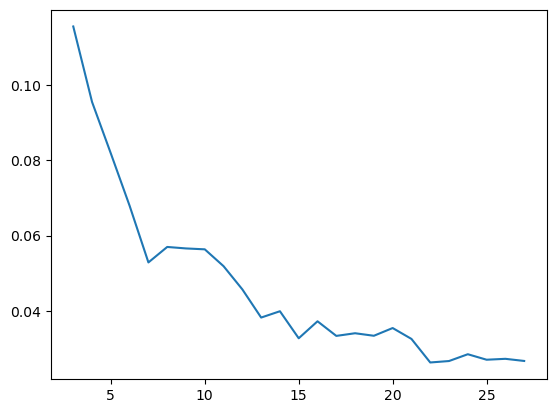

In [11]:
plt.plot(Ranges,np.mean(RMSE_delta,axis=1))


In [20]:
Means_delta = np.mean(RMSE_delta,axis=1)
Medians_delta = np.median(RMSE_delta,axis=1)
Stds_delta = np.std(RMSE_delta,axis=1)
Means_power = np.mean(RMSE_power,axis=1)
Medians_power = np.median(RMSE_power,axis=1)
Stds_power = np.std(RMSE_power,axis=1)

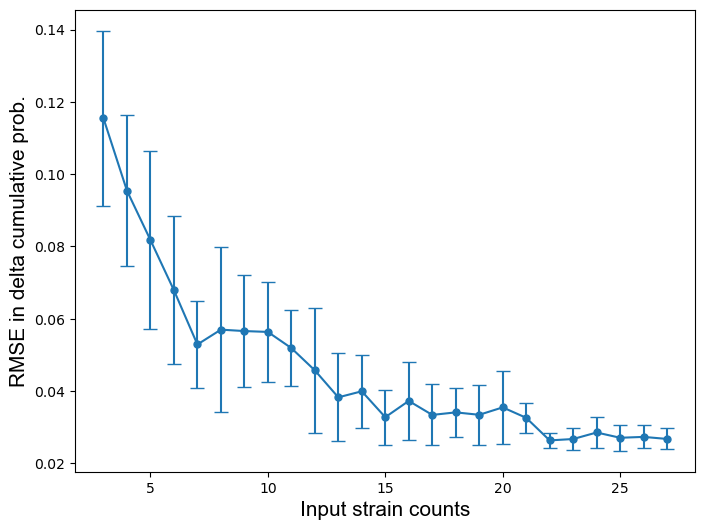

In [23]:
plt.figure(figsize=(8,6))  
plt.plot(
    Ranges,Means_delta,
    linestyle='-', 
    marker='.', 
    ms=10, 
)
plt.errorbar(
    Ranges,Means_delta,
    yerr=list(Stds_delta),
    fmt="none",
    capsize = 5
)
plt.xlabel("Input strain counts",size=15,fontname="Arial")
plt.ylabel("RMSE in delta cumulative prob.",size=15,fontname="Arial")
plt.savefig("Figures/Fig. 5a.pdf", bbox_inches="tight")
plt.show()

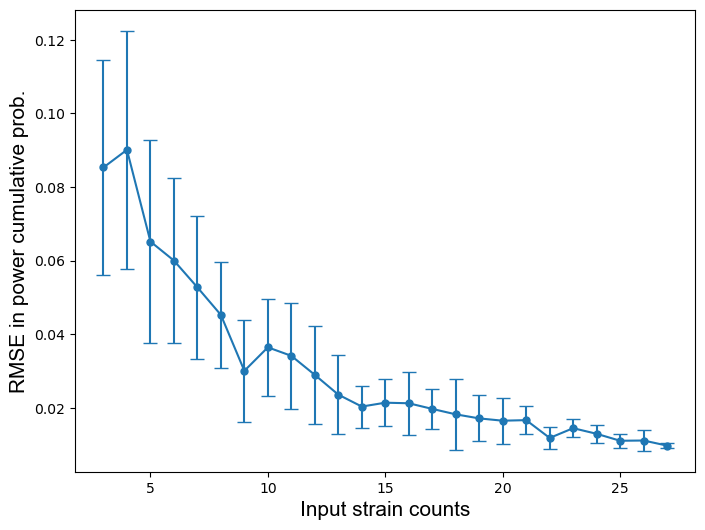

In [24]:
plt.figure(figsize=(8,6))  
plt.plot(
    Ranges,Means_power,
    linestyle='-', 
    marker='.', 
    ms=10, 
)
plt.errorbar(
    Ranges,Means_power,
    yerr=list(Stds_power),
    fmt="none",
    capsize = 5
)
plt.xlabel("Input strain counts",size=15,fontname="Arial")
plt.ylabel("RMSE in power cumulative prob.",size=15,fontname="Arial")
plt.savefig("Figures/Fig. 5b.pdf", bbox_inches="tight")
plt.show()